In [1]:
import cv2


chessImg=cv2.imread("images/chess.jpg")
lakeImg=cv2.imread("images/lake.jpg")

Analyzing Chess Image...
Analyzing Lake Image...


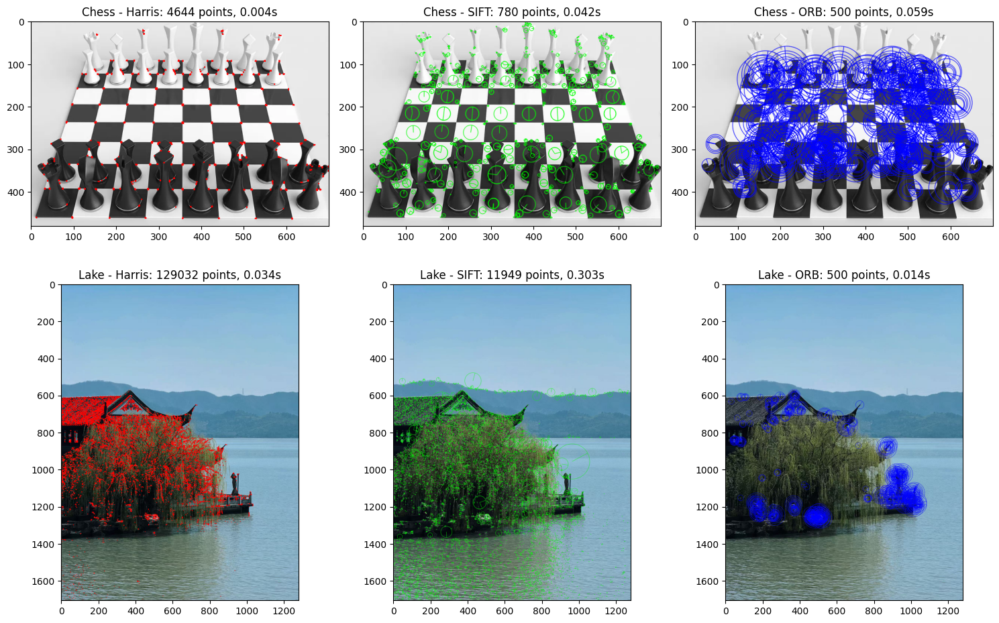


Analyzing Feature Distribution...

--- Chess Image Analysis ---
Harris: 4644 points, 0.004s, X-Std: 178.09, Y-Std: 117.48, Coverage: 0.013793
SIFT: 780 points, 0.042s, X-Std: 172.93, Y-Std: 126.05, Coverage: 0.002317
ORB: 500 points, 0.059s, X-Std: 157.59, Y-Std: 82.08, Coverage: 0.001485

--- Lake Image Analysis ---
Harris: 129032 points, 0.034s, X-Std: 256.59, Y-Std: 190.95, Coverage: 0.059135
SIFT: 11949 points, 0.303s, X-Std: 286.96, Y-Std: 330.37, Coverage: 0.005476
ORB: 500 points, 0.014s, X-Std: 322.18, Y-Std: 213.22, Coverage: 0.000229


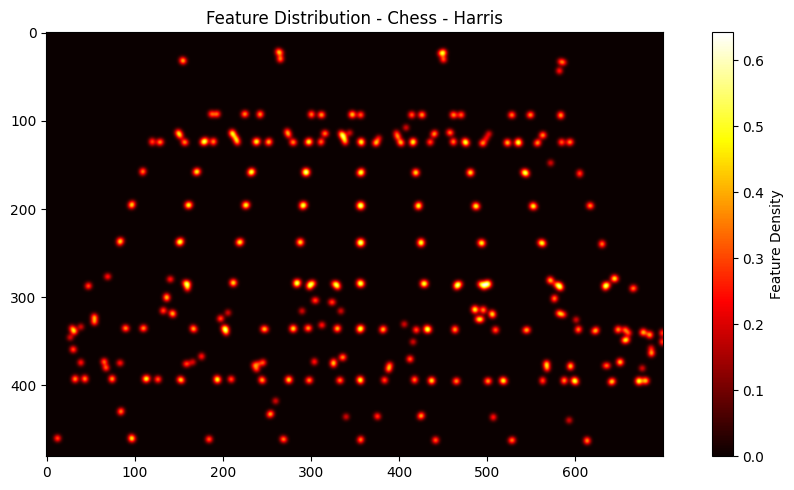

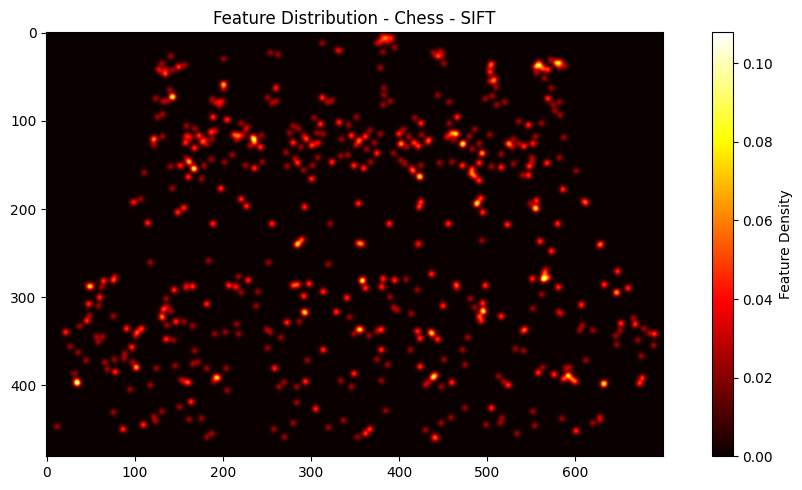

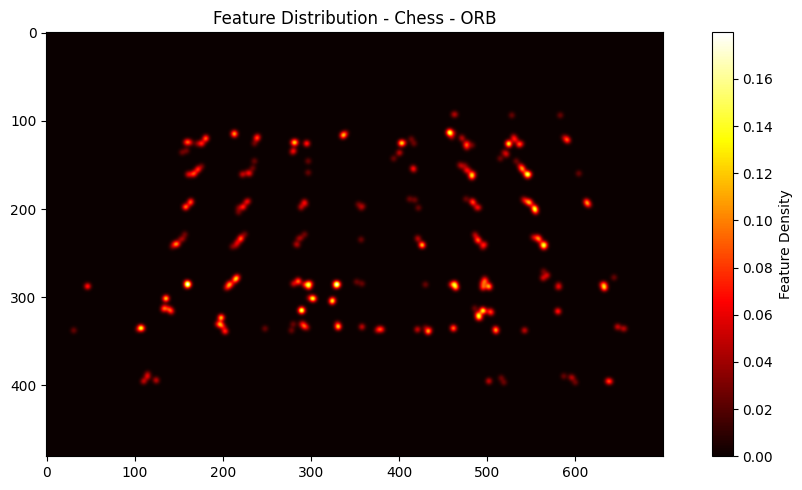

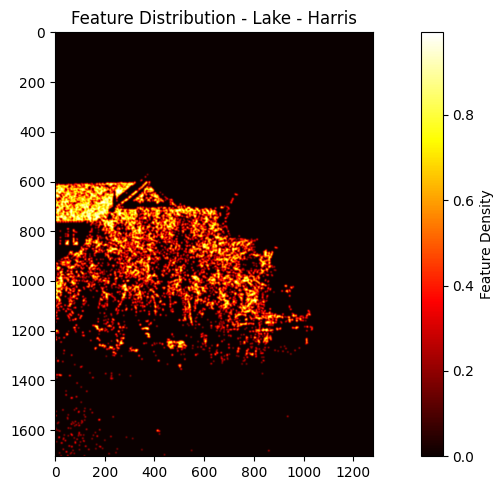

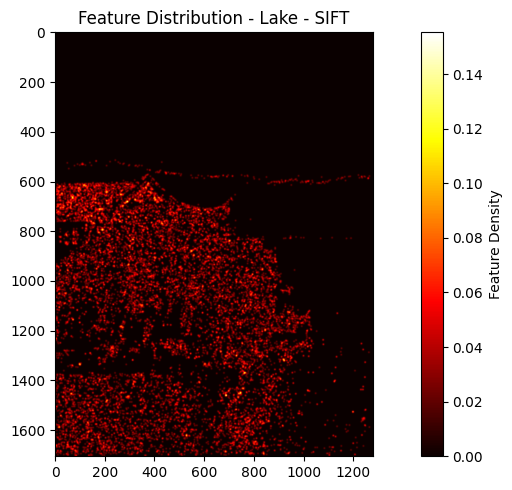

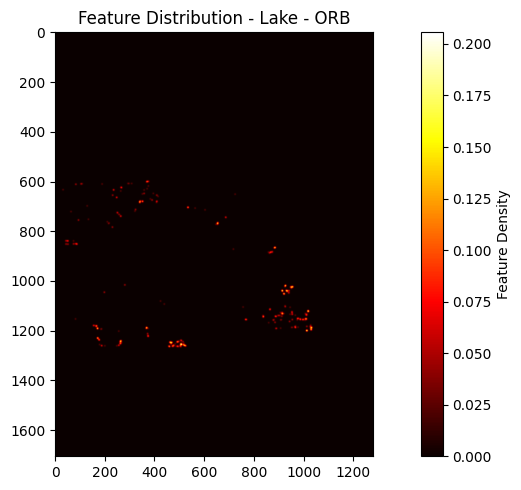

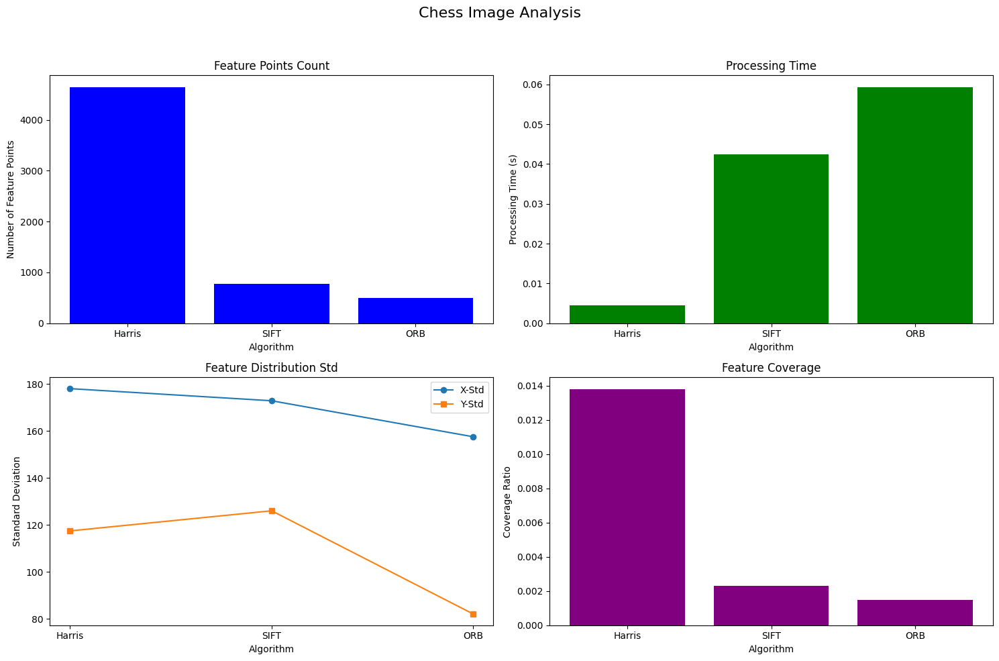

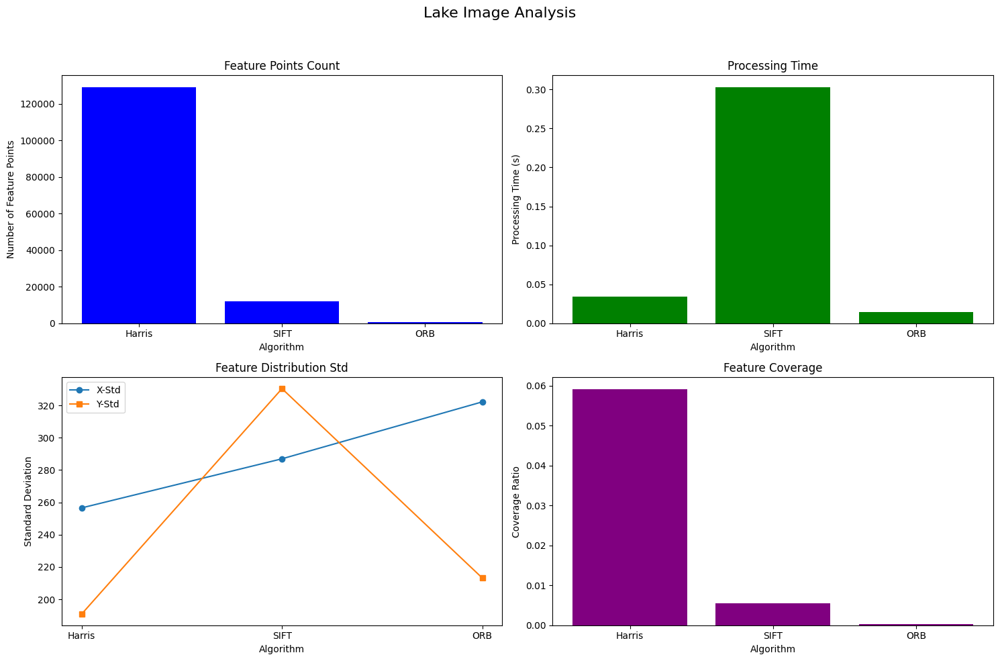

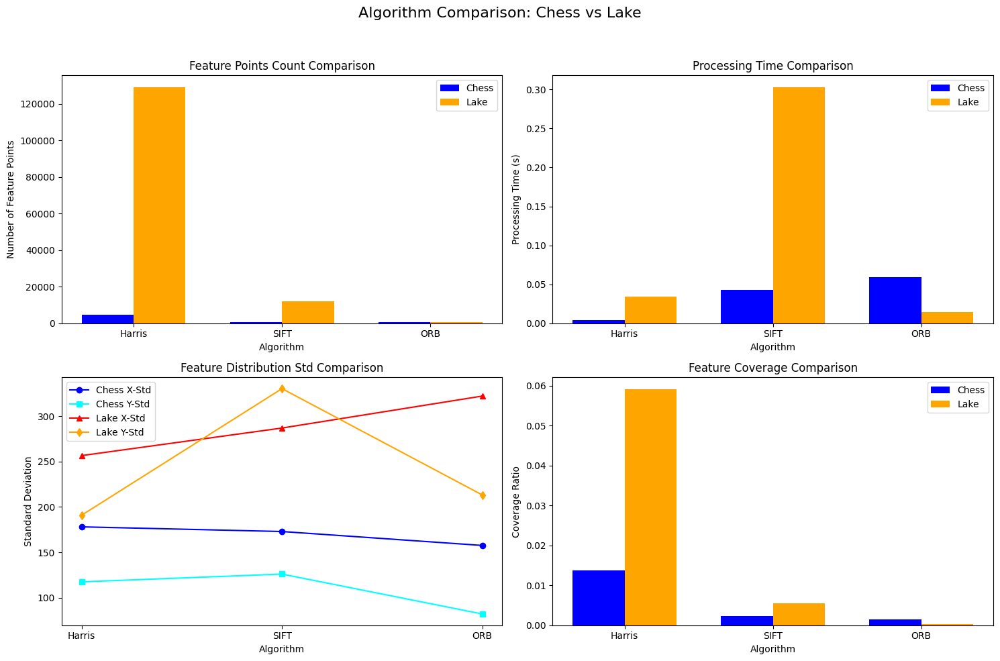

In [2]:
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt

def detect_harris_corners(image, blockSize=2, ksize=3, k=0.04, threshold=0.01):
    start_time = time.time()
    
    # 转换为灰度图
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 检测Harris角点
    dst = cv2.cornerHarris(gray, blockSize, ksize, k)
    
    # 膨胀结果以标记角点
    dst_dilated = cv2.dilate(dst, None)
    
    # 阈值处理，获取角点
    threshold_value = threshold * dst_dilated.max()
    corners = np.where(dst_dilated > threshold_value)
    
    # 计算处理时间
    processing_time = time.time() - start_time
    
    # 创建结果图像
    result_img = image.copy()
    result_img[corners[0], corners[1]] = [0, 0, 255]  # 红色标记角点
    
    return result_img, len(corners[0]), processing_time, corners

def detect_sift(image):
    start_time = time.time()
    
    # 转换为灰度图
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 创建SIFT对象
    sift = cv2.SIFT_create()
    
    # 检测关键点
    keypoints = sift.detect(gray, None)
    
    # 计算处理时间
    processing_time = time.time() - start_time
    
    # 绘制关键点
    result_img = cv2.drawKeypoints(image, keypoints, None, color=(0, 255, 0), 
                                   flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # 提取关键点坐标
    coords = np.array([[kp.pt[1], kp.pt[0]] for kp in keypoints]).astype(int)
    if len(coords) > 0:
        coords = (coords[:, 0], coords[:, 1])
    else:
        coords = (np.array([]), np.array([]))
    
    return result_img, len(keypoints), processing_time, coords

def detect_orb(image, nfeatures=500):
    start_time = time.time()
    
    # 转换为灰度图
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 创建ORB对象
    orb = cv2.ORB_create(nfeatures=nfeatures)
    
    # 检测关键点
    keypoints = orb.detect(gray, None)
    
    # 计算处理时间
    processing_time = time.time() - start_time
    
    # 绘制关键点
    result_img = cv2.drawKeypoints(image, keypoints, None, color=(255, 0, 0), 
                                   flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # 提取关键点坐标
    coords = np.array([[kp.pt[1], kp.pt[0]] for kp in keypoints]).astype(int)
    if len(coords) > 0:
        coords = (coords[:, 0], coords[:, 1])
    else:
        coords = (np.array([]), np.array([]))
    
    return result_img, len(keypoints), processing_time, coords

def analyze_feature_distribution(coords, image_shape, title):
    plt.figure(figsize=(10, 5))
    
    # 创建热图
    heatmap = np.zeros(image_shape[:2])
    if len(coords[0]) > 0:
        for i in range(len(coords[0])):
            if 0 <= coords[0][i] < image_shape[0] and 0 <= coords[1][i] < image_shape[1]:
                heatmap[coords[0][i], coords[1][i]] += 1
    
    # 使用高斯模糊使热图更平滑
    heatmap = cv2.GaussianBlur(heatmap, (15, 15), 0)
    
    plt.imshow(heatmap, cmap='hot')
    plt.colorbar(label='Feature Density')
    plt.title(f'Feature Distribution - {title}')
    plt.tight_layout()
    
    # 计算特征点的空间分布统计
    if len(coords[0]) > 0:
        x_std = np.std(coords[1])
        y_std = np.std(coords[0])
        coverage = len(coords[0]) / (image_shape[0] * image_shape[1])
    else:
        x_std = 0
        y_std = 0
        coverage = 0
    
    return x_std, y_std, coverage

# 加载图像
chessImg = cv2.imread("images/chess.jpg")
lakeImg = cv2.imread("images/lake.jpg")

if chessImg is None or lakeImg is None:
    print("Error: Could not load one or both images.")
    exit()

# 分析棋盘图像
print("Analyzing Chess Image...")
chess_harris_img, chess_harris_count, chess_harris_time, chess_harris_coords = detect_harris_corners(chessImg)
chess_sift_img, chess_sift_count, chess_sift_time, chess_sift_coords = detect_sift(chessImg)
chess_orb_img, chess_orb_count, chess_orb_time, chess_orb_coords = detect_orb(chessImg)

# 分析湖泊图像
print("Analyzing Lake Image...")
lake_harris_img, lake_harris_count, lake_harris_time, lake_harris_coords = detect_harris_corners(lakeImg)
lake_sift_img, lake_sift_count, lake_sift_time, lake_sift_coords = detect_sift(lakeImg)
lake_orb_img, lake_orb_count, lake_orb_time, lake_orb_coords = detect_orb(lakeImg)

# 显示结果
plt.figure(figsize=(15, 10))

# 棋盘图像结果
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(chess_harris_img, cv2.COLOR_BGR2RGB))
plt.title(f'Chess - Harris: {chess_harris_count} points, {chess_harris_time:.3f}s')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(chess_sift_img, cv2.COLOR_BGR2RGB))
plt.title(f'Chess - SIFT: {chess_sift_count} points, {chess_sift_time:.3f}s')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(chess_orb_img, cv2.COLOR_BGR2RGB))
plt.title(f'Chess - ORB: {chess_orb_count} points, {chess_orb_time:.3f}s')

# 湖泊图像结果
plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(lake_harris_img, cv2.COLOR_BGR2RGB))
plt.title(f'Lake - Harris: {lake_harris_count} points, {lake_harris_time:.3f}s')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(lake_sift_img, cv2.COLOR_BGR2RGB))
plt.title(f'Lake - SIFT: {lake_sift_count} points, {lake_sift_time:.3f}s')

plt.subplot(2, 3, 6)
plt.imshow(cv2.cvtColor(lake_orb_img, cv2.COLOR_BGR2RGB))
plt.title(f'Lake - ORB: {lake_orb_count} points, {lake_orb_time:.3f}s')

plt.tight_layout()
plt.savefig('feature_detection_results.png')
plt.show()

# 分析特征点分布
print("\nAnalyzing Feature Distribution...")

# 棋盘图像特征点分布分析
chess_harris_x_std, chess_harris_y_std, chess_harris_coverage = analyze_feature_distribution(
    chess_harris_coords, chessImg.shape, "Chess - Harris")
chess_sift_x_std, chess_sift_y_std, chess_sift_coverage = analyze_feature_distribution(
    chess_sift_coords, chessImg.shape, "Chess - SIFT")
chess_orb_x_std, chess_orb_y_std, chess_orb_coverage = analyze_feature_distribution(
    chess_orb_coords, chessImg.shape, "Chess - ORB")

# 湖泊图像特征点分布分析
lake_harris_x_std, lake_harris_y_std, lake_harris_coverage = analyze_feature_distribution(
    lake_harris_coords, lakeImg.shape, "Lake - Harris")
lake_sift_x_std, lake_sift_y_std, lake_sift_coverage = analyze_feature_distribution(
    lake_sift_coords, lakeImg.shape, "Lake - SIFT")
lake_orb_x_std, lake_orb_y_std, lake_orb_coverage = analyze_feature_distribution(
    lake_orb_coords, lakeImg.shape, "Lake - ORB")

# 打印分析结果
print("\n--- Chess Image Analysis ---")
print(f"Harris: {chess_harris_count} points, {chess_harris_time:.3f}s, X-Std: {chess_harris_x_std:.2f}, Y-Std: {chess_harris_y_std:.2f}, Coverage: {chess_harris_coverage:.6f}")
print(f"SIFT: {chess_sift_count} points, {chess_sift_time:.3f}s, X-Std: {chess_sift_x_std:.2f}, Y-Std: {chess_sift_y_std:.2f}, Coverage: {chess_sift_coverage:.6f}")
print(f"ORB: {chess_orb_count} points, {chess_orb_time:.3f}s, X-Std: {chess_orb_x_std:.2f}, Y-Std: {chess_orb_y_std:.2f}, Coverage: {chess_orb_coverage:.6f}")

print("\n--- Lake Image Analysis ---")
print(f"Harris: {lake_harris_count} points, {lake_harris_time:.3f}s, X-Std: {lake_harris_x_std:.2f}, Y-Std: {lake_harris_y_std:.2f}, Coverage: {lake_harris_coverage:.6f}")
print(f"SIFT: {lake_sift_count} points, {lake_sift_time:.3f}s, X-Std: {lake_sift_x_std:.2f}, Y-Std: {lake_sift_y_std:.2f}, Coverage: {lake_sift_coverage:.6f}")
print(f"ORB: {lake_orb_count} points, {lake_orb_time:.3f}s, X-Std: {lake_orb_x_std:.2f}, Y-Std: {lake_orb_y_std:.2f}, Coverage: {lake_orb_coverage:.6f}")

# 绘制分离的比较图表
algorithms = ['Harris', 'SIFT', 'ORB']

# 棋盘图像分析图表
plt.figure(figsize=(15, 10))
plt.suptitle('Chess Image Analysis', fontsize=16)

# 特征点数量
plt.subplot(2, 2, 1)
chess_counts = [chess_harris_count, chess_sift_count, chess_orb_count]
plt.bar(algorithms, chess_counts, color='blue')
plt.xlabel('Algorithm')
plt.ylabel('Number of Feature Points')
plt.title('Feature Points Count')

# 处理时间
plt.subplot(2, 2, 2)
chess_times = [chess_harris_time, chess_sift_time, chess_orb_time]
plt.bar(algorithms, chess_times, color='green')
plt.xlabel('Algorithm')
plt.ylabel('Processing Time (s)')
plt.title('Processing Time')

# 特征点分布标准差
plt.subplot(2, 2, 3)
chess_x_stds = [chess_harris_x_std, chess_sift_x_std, chess_orb_x_std]
chess_y_stds = [chess_harris_y_std, chess_sift_y_std, chess_orb_y_std]
plt.plot(algorithms, chess_x_stds, 'o-', label='X-Std')
plt.plot(algorithms, chess_y_stds, 's-', label='Y-Std')
plt.xlabel('Algorithm')
plt.ylabel('Standard Deviation')
plt.title('Feature Distribution Std')
plt.legend()

# 特征点覆盖率
plt.subplot(2, 2, 4)
chess_coverages = [chess_harris_coverage, chess_sift_coverage, chess_orb_coverage]
plt.bar(algorithms, chess_coverages, color='purple')
plt.xlabel('Algorithm')
plt.ylabel('Coverage Ratio')
plt.title('Feature Coverage')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('chess_image_analysis.png')
plt.show()

# 湖泊图像分析图表
plt.figure(figsize=(15, 10))
plt.suptitle('Lake Image Analysis', fontsize=16)

# 特征点数量
plt.subplot(2, 2, 1)
lake_counts = [lake_harris_count, lake_sift_count, lake_orb_count]
plt.bar(algorithms, lake_counts, color='blue')
plt.xlabel('Algorithm')
plt.ylabel('Number of Feature Points')
plt.title('Feature Points Count')

# 处理时间
plt.subplot(2, 2, 2)
lake_times = [lake_harris_time, lake_sift_time, lake_orb_time]
plt.bar(algorithms, lake_times, color='green')
plt.xlabel('Algorithm')
plt.ylabel('Processing Time (s)')
plt.title('Processing Time')

# 特征点分布标准差
plt.subplot(2, 2, 3)
lake_x_stds = [lake_harris_x_std, lake_sift_x_std, lake_orb_x_std]
lake_y_stds = [lake_harris_y_std, lake_sift_y_std, lake_orb_y_std]
plt.plot(algorithms, lake_x_stds, 'o-', label='X-Std')
plt.plot(algorithms, lake_y_stds, 's-', label='Y-Std')
plt.xlabel('Algorithm')
plt.ylabel('Standard Deviation')
plt.title('Feature Distribution Std')
plt.legend()

# 特征点覆盖率
plt.subplot(2, 2, 4)
lake_coverages = [lake_harris_coverage, lake_sift_coverage, lake_orb_coverage]
plt.bar(algorithms, lake_coverages, color='purple')
plt.xlabel('Algorithm')
plt.ylabel('Coverage Ratio')
plt.title('Feature Coverage')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('lake_image_analysis.png')
plt.show()

# 添加算法比较图表
plt.figure(figsize=(15, 10))
plt.suptitle('Algorithm Comparison: Chess vs Lake', fontsize=16)

# 特征点数量比较
plt.subplot(2, 2, 1)
x = np.arange(len(algorithms))
width = 0.35
plt.bar(x - width/2, chess_counts, width, label='Chess', color='blue')
plt.bar(x + width/2, lake_counts, width, label='Lake', color='orange')
plt.xlabel('Algorithm')
plt.ylabel('Number of Feature Points')
plt.title('Feature Points Count Comparison')
plt.xticks(x, algorithms)
plt.legend()

# 处理时间比较
plt.subplot(2, 2, 2)
plt.bar(x - width/2, chess_times, width, label='Chess', color='blue')
plt.bar(x + width/2, lake_times, width, label='Lake', color='orange')
plt.xlabel('Algorithm')
plt.ylabel('Processing Time (s)')
plt.title('Processing Time Comparison')
plt.xticks(x, algorithms)
plt.legend()

# 特征点分布标准差比较
plt.subplot(2, 2, 3)
plt.plot(algorithms, chess_x_stds, 'o-', label='Chess X-Std', color='blue')
plt.plot(algorithms, chess_y_stds, 's-', label='Chess Y-Std', color='cyan')
plt.plot(algorithms, lake_x_stds, '^-', label='Lake X-Std', color='red')
plt.plot(algorithms, lake_y_stds, 'd-', label='Lake Y-Std', color='orange')
plt.xlabel('Algorithm')
plt.ylabel('Standard Deviation')
plt.title('Feature Distribution Std Comparison')
plt.legend()

# 特征点覆盖率比较
plt.subplot(2, 2, 4)
plt.bar(x - width/2, chess_coverages, width, label='Chess', color='blue')
plt.bar(x + width/2, lake_coverages, width, label='Lake', color='orange')
plt.xlabel('Algorithm')
plt.ylabel('Coverage Ratio')
plt.title('Feature Coverage Comparison')
plt.xticks(x, algorithms)
plt.legend()

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('algorithm_comparison.png')
plt.show()


# SIFT

In [3]:
img1=cv2.imread("images/sift1.jpg")
img2=cv2.imread("images/sift2.jpg")
img3=cv2.imread("images/sift3.jpg")

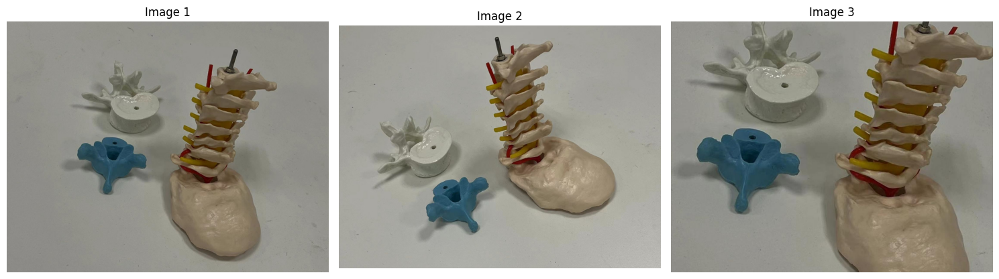

Testing different ratio thresholds...

Ratio threshold: 0.75
Total matches: 115
Inlier matches: 22
Inlier ratio: 0.19
Matching time: 0.0170 seconds
Match quality score: 30.6/100
Match quality: Poor
  Image 1 vs Image 2: Score 30.6/100
Total matches: 581
Inlier matches: 564
Inlier ratio: 0.97
Matching time: 0.0154 seconds
Match quality score: 100.0/100
Match quality: Excellent
  Image 1 vs Image 3: Score 100.0/100
Total matches: 103
Inlier matches: 22
Inlier ratio: 0.21
Matching time: 0.0183 seconds
Match quality score: 31.7/100
Match quality: Poor
  Image 2 vs Image 3: Score 31.7/100
Average score: 54.1/100

Ratio threshold: 0.65
Total matches: 58
Inlier matches: 15
Inlier ratio: 0.26
Matching time: 0.0160 seconds
Match quality score: 31.7/100
Match quality: Poor
  Image 1 vs Image 2: Score 31.7/100
Total matches: 544
Inlier matches: 537
Inlier ratio: 0.99
Matching time: 0.0149 seconds
Match quality score: 100.0/100
Match quality: Excellent
  Image 1 vs Image 3: Score 100.0/100
Total m

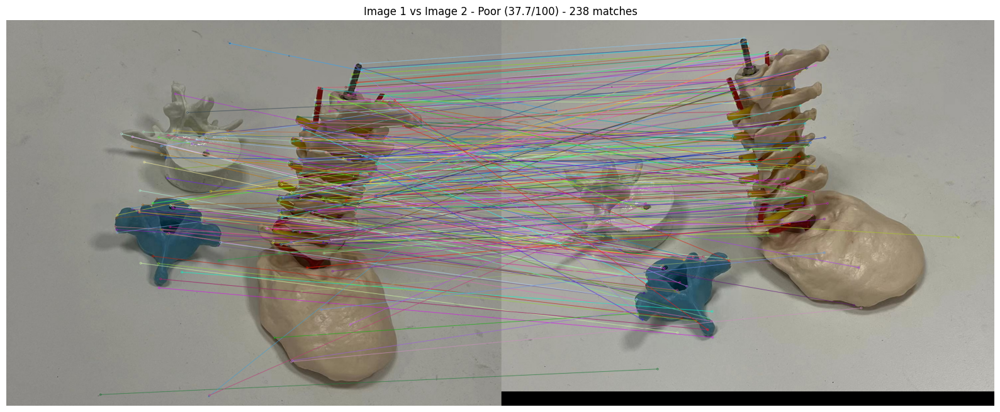

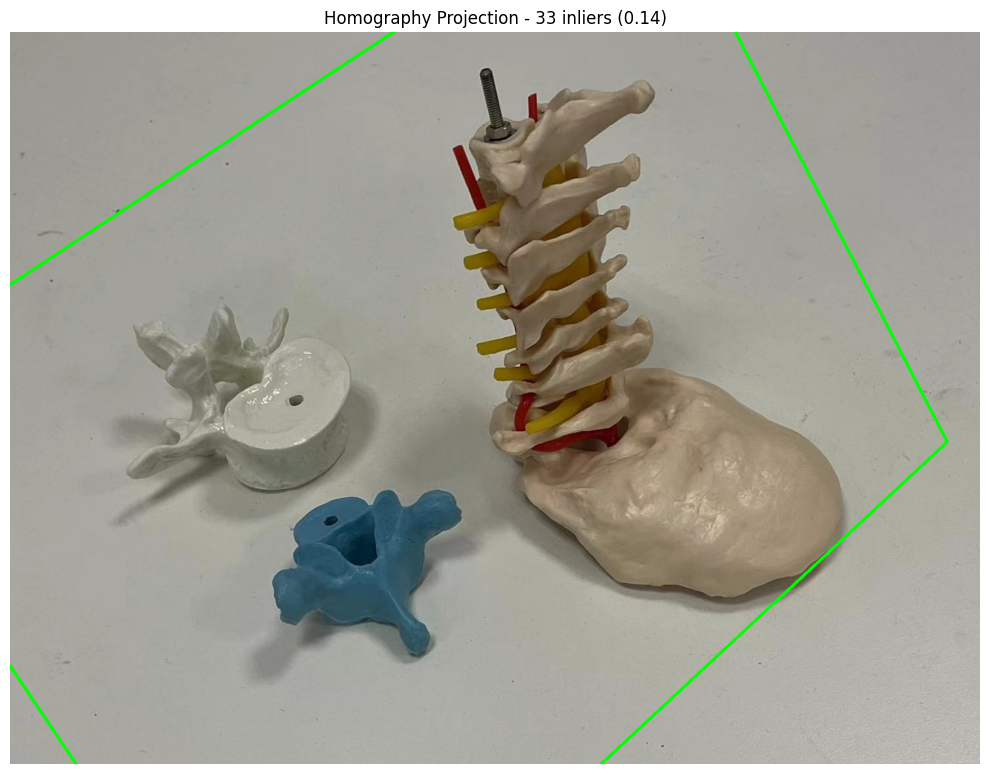

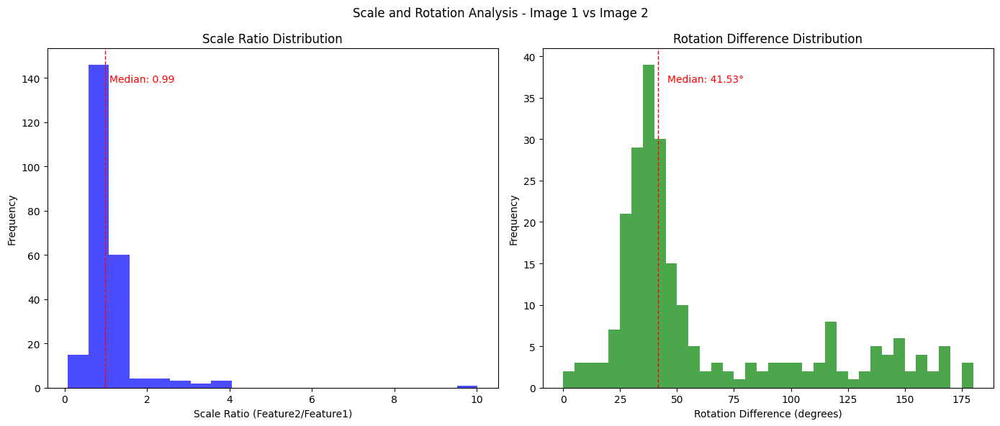


Image 1 vs Image 3:
Total matches: 633
Inlier matches: 580
Inlier ratio: 0.92
Matching time: 0.0144 seconds
Match quality score: 100.0/100
Match quality: Excellent


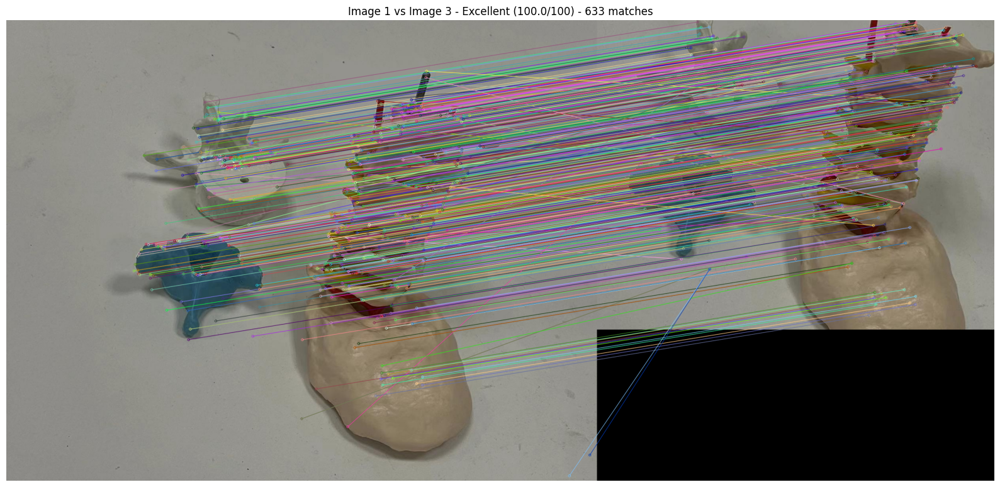

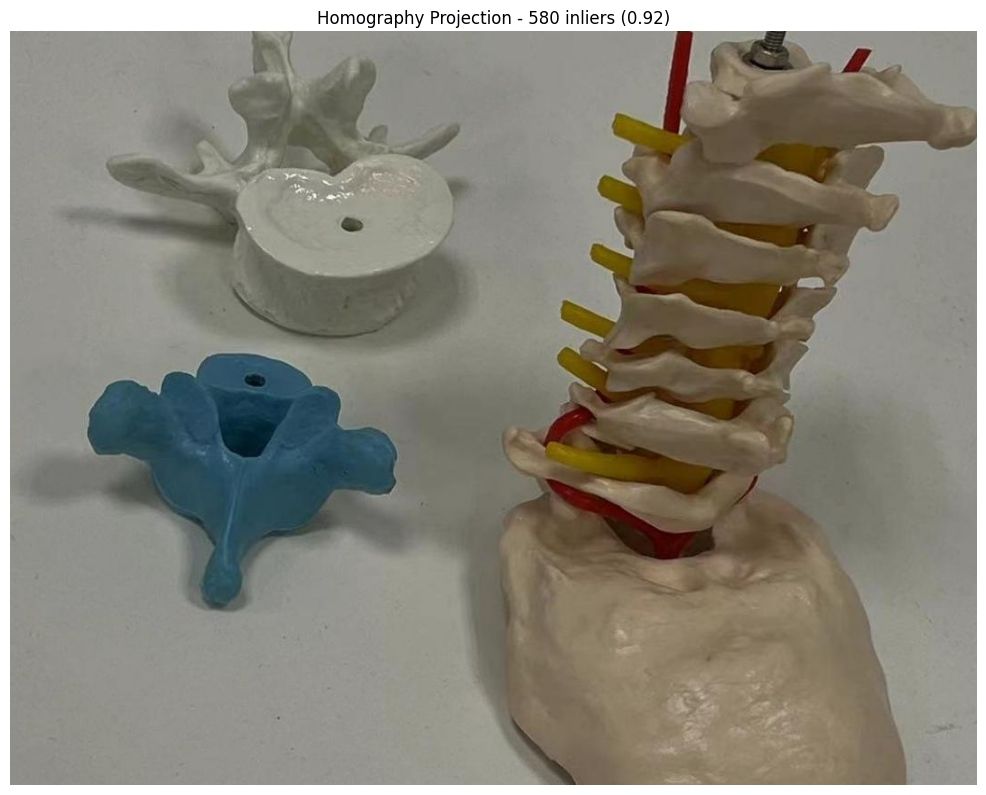

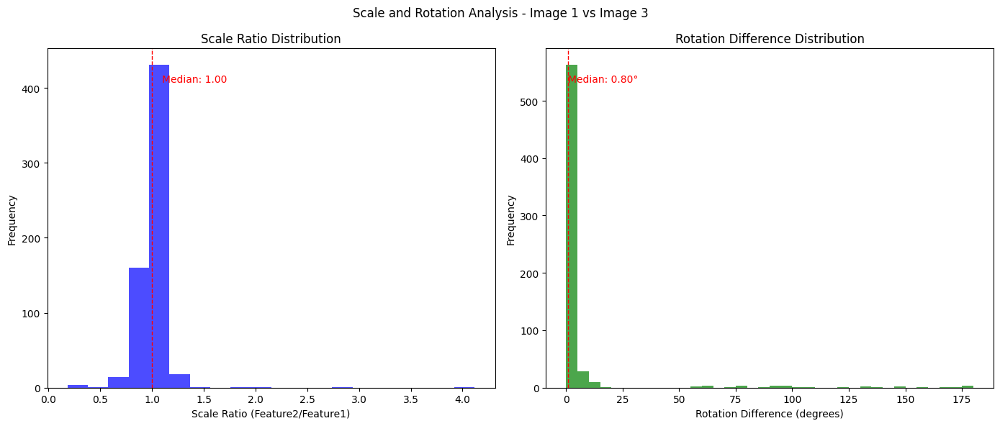


Image 2 vs Image 3:
Total matches: 272
Inlier matches: 28
Inlier ratio: 0.10
Matching time: 0.0201 seconds
Match quality score: 37.5/100
Match quality: Poor


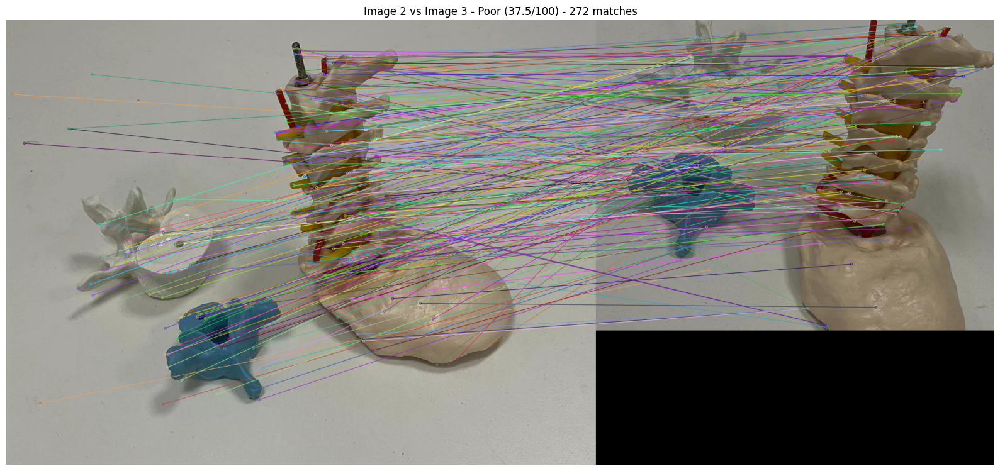

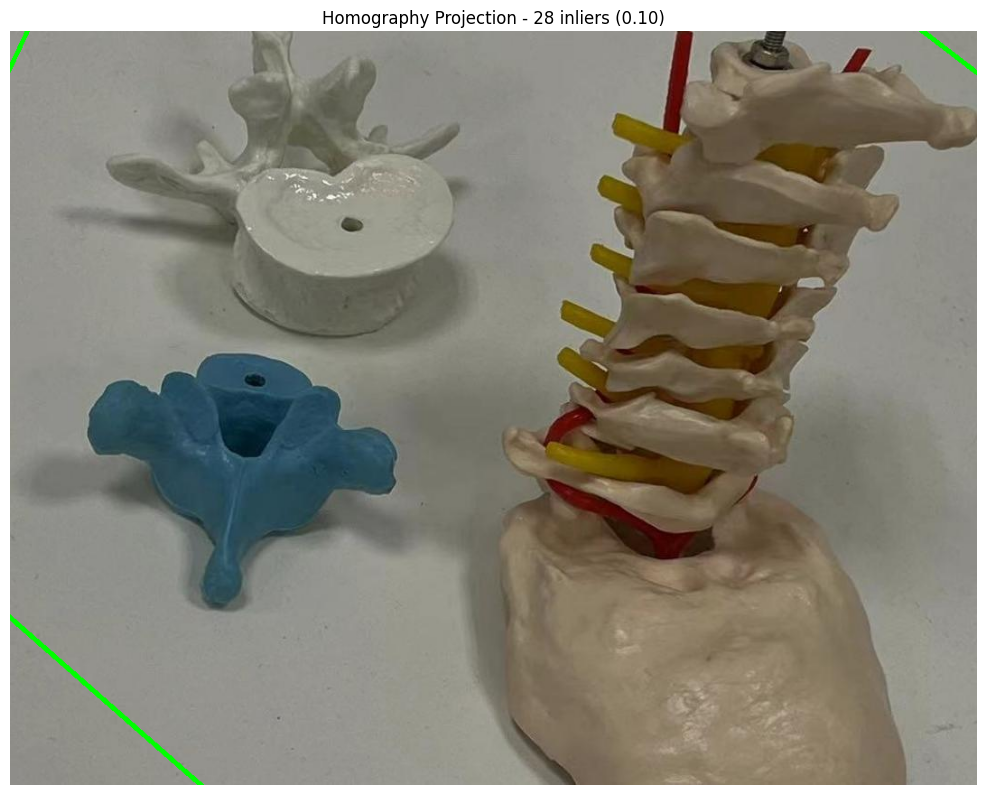

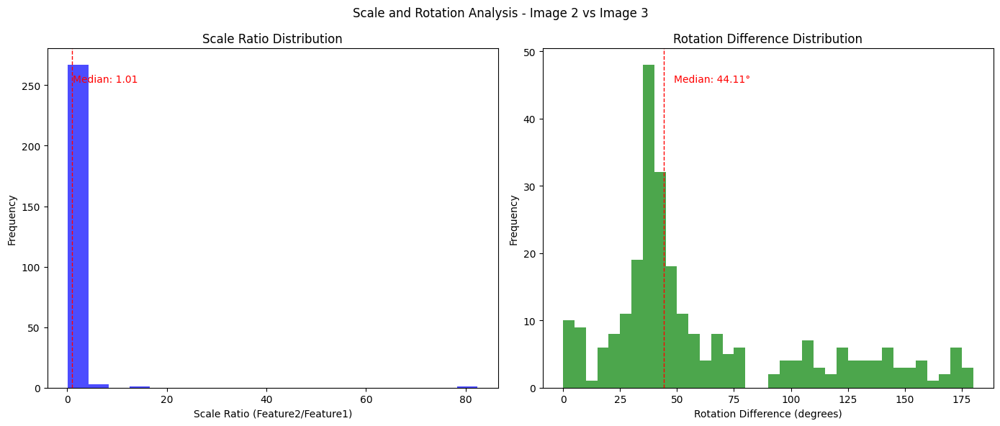


=== Summary ===
Best ratio threshold: 0.85


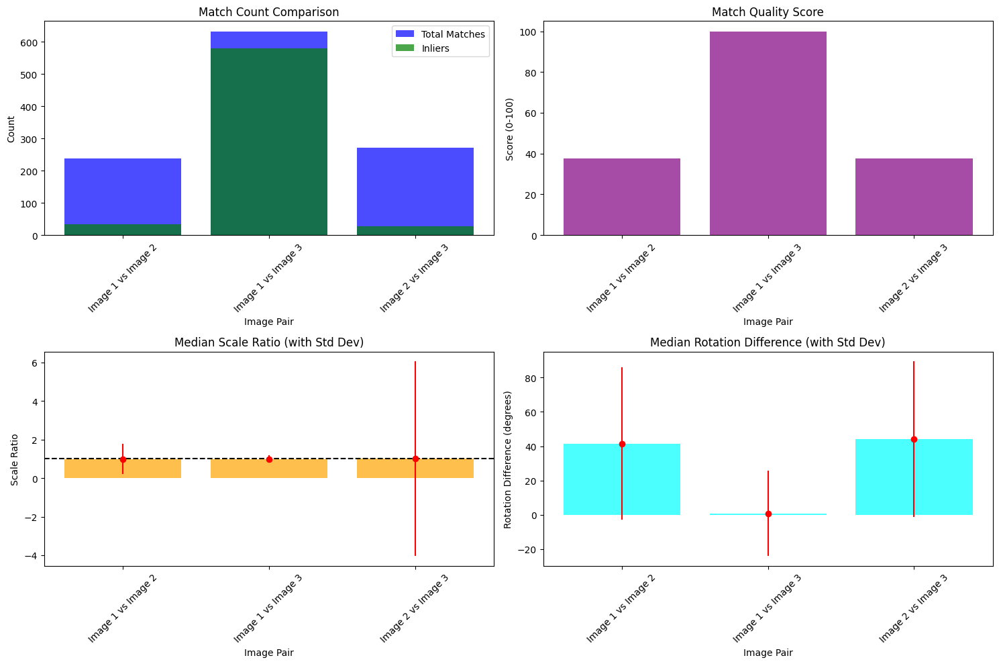


=== Scale and Rotation Invariance Verification ===

Image 1 vs Image 2:
  Median scale ratio: 0.99 ± 0.78
  Median rotation difference: 41.53° ± 44.36°
  Scale invariance: Good
  Rotation invariance: Fair

Image 1 vs Image 3:
  Median scale ratio: 1.00 ± 0.19
  Median rotation difference: 0.80° ± 24.87°
  Scale invariance: Good
  Rotation invariance: Fair

Image 2 vs Image 3:
  Median scale ratio: 1.01 ± 5.05
  Median rotation difference: 44.11° ± 45.33°
  Scale invariance: Good
  Rotation invariance: Poor


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time

def apply_sift_and_match(img1, img2, ratio_threshold=0.75, min_match_count=10):
    """
    应用SIFT算法提取特征并进行匹配
    
    参数:
    img1, img2: 输入图像
    ratio_threshold: Lowe's比率测试阈值
    min_match_count: 最小匹配点数
    
    返回:
    matches: 筛选后的匹配
    kp1, kp2: 两幅图像的关键点
    des1, des2: 两幅图像的描述符
    match_time: 匹配耗时
    """
    # 转换为灰度图
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    # 创建SIFT对象
    sift = cv2.SIFT_create()
    
    # 检测关键点并计算描述符
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)
    
    # 创建FLANN匹配器
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # 开始计时
    start_time = time.time()
    
    # 使用knnMatch获取k个最佳匹配
    raw_matches = flann.knnMatch(des1, des2, k=2)
    
    # 应用Lowe's比率测试
    good_matches = []
    for m, n in raw_matches:
        if m.distance < ratio_threshold * n.distance:
            good_matches.append(m)
    
    # 计算匹配耗时
    match_time = time.time() - start_time
    
    return good_matches, kp1, kp2, des1, des2, match_time

def draw_matches(img1, kp1, img2, kp2, matches, title="SIFT Matches"):
    """绘制匹配结果"""
    match_img = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, 
                               flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    plt.figure(figsize=(16, 8))
    plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
    plt.title(f"{title} - {len(matches)} matches")
    plt.axis('off')
    plt.tight_layout()
    return match_img

def analyze_scale_rotation(kp1, kp2, matches):
    """分析匹配点的尺度和旋转变化"""
    scales = []
    rotations = []
    
    for match in matches:
        # 获取匹配的关键点
        pt1 = kp1[match.queryIdx]
        pt2 = kp2[match.trainIdx]
        
        # 计算尺度比例
        scale_ratio = pt2.size / pt1.size
        scales.append(scale_ratio)
        
        # 计算旋转角度差异 (转换为度)
        angle_diff = (pt2.angle - pt1.angle) % 360
        if angle_diff > 180:
            angle_diff = 360 - angle_diff
        rotations.append(angle_diff)
    
    return scales, rotations

def plot_scale_rotation_analysis(scales, rotations, title="Scale and Rotation Analysis"):
    """绘制尺度和旋转分析图"""
    plt.figure(figsize=(14, 6))
    
    # 尺度分布直方图
    plt.subplot(1, 2, 1)
    plt.hist(scales, bins=20, color='blue', alpha=0.7)
    plt.axvline(np.median(scales), color='red', linestyle='dashed', linewidth=1)
    plt.text(np.median(scales)*1.1, plt.ylim()[1]*0.9, f'Median: {np.median(scales):.2f}', color='red')
    plt.xlabel('Scale Ratio (Feature2/Feature1)')
    plt.ylabel('Frequency')
    plt.title('Scale Ratio Distribution')
    
    # 旋转角度分布直方图
    plt.subplot(1, 2, 2)
    plt.hist(rotations, bins=36, range=(0, 180), color='green', alpha=0.7)
    plt.axvline(np.median(rotations), color='red', linestyle='dashed', linewidth=1)
    plt.text(np.median(rotations)*1.1, plt.ylim()[1]*0.9, f'Median: {np.median(rotations):.2f}°', color='red')
    plt.xlabel('Rotation Difference (degrees)')
    plt.ylabel('Frequency')
    plt.title('Rotation Difference Distribution')
    
    plt.suptitle(title)
    plt.tight_layout()

def compute_homography_and_verify(kp1, kp2, matches, img1, img2, threshold=5.0):
    """计算单应性矩阵并验证匹配质量"""
    # 提取匹配点坐标
    if len(matches) < 4:
        print("Not enough matches to compute homography!")
        return None, 0, 0, None
    
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    # 计算单应性矩阵
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, threshold)
    
    # 计算内点比例
    inlier_ratio = float(mask.sum()) / len(matches)
    
    # 使用单应性矩阵变换图像1
    h, w = img1.shape[:2]
    transformed_corners = cv2.perspectiveTransform(
        np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2), 
        H
    )
    
    # 绘制变换后的边界框
    img_with_box = img2.copy()
    cv2.polylines(img_with_box, [np.int32(transformed_corners)], True, (0, 255, 0), 3)
    
    return H, inlier_ratio, mask.sum(), img_with_box

def evaluate_matches(matches, inlier_count, inlier_ratio, match_time):
    """评估匹配结果"""
    print(f"Total matches: {len(matches)}")
    print(f"Inlier matches: {inlier_count}")
    print(f"Inlier ratio: {inlier_ratio:.2f}")
    print(f"Matching time: {match_time:.4f} seconds")
    
    # 匹配质量评分 (0-100)
    match_score = min(100, inlier_ratio * 100 + min(50, len(matches)/10))
    print(f"Match quality score: {match_score:.1f}/100")
    
    # 匹配质量评级
    if match_score > 80:
        quality = "Excellent"
    elif match_score > 60:
        quality = "Good"
    elif match_score > 40:
        quality = "Fair"
    else:
        quality = "Poor"
    
    print(f"Match quality: {quality}")
    return match_score, quality

# 加载图像
img1 = cv2.imread("images/sift1.jpg")
img2 = cv2.imread("images/sift2.jpg")
img3 = cv2.imread("images/sift3.jpg")

if img1 is None or img2 is None or img3 is None:
    print("Error: Could not load one or more images.")
    exit()

# 调整图像大小以便显示
max_dim = 800
for img in [img1, img2, img3]:
    h, w = img.shape[:2]
    if max(h, w) > max_dim:
        scale = max_dim / max(h, w)
        img = cv2.resize(img, None, fx=scale, fy=scale)

# 显示原始图像
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title("Image 1")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title("Image 2")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
plt.title("Image 3")
plt.axis('off')

plt.tight_layout()
plt.savefig('original_images.png')
plt.show()

# 图像对比较
image_pairs = [
    (img1, img2, "Image 1 vs Image 2"),
    (img1, img3, "Image 1 vs Image 3"),
    (img2, img3, "Image 2 vs Image 3")
]

# 设置不同的阈值进行测试
ratio_thresholds = [0.75, 0.65, 0.85]
best_threshold = 0.75  # 默认值
best_score = 0

results = []

# 测试不同的阈值
print("Testing different ratio thresholds...")
for ratio in ratio_thresholds:
    print(f"\nRatio threshold: {ratio}")
    total_score = 0
    
    for idx, (img_a, img_b, title) in enumerate(image_pairs):
        matches, kp_a, kp_b, des_a, des_b, match_time = apply_sift_and_match(img_a, img_b, ratio)
        H, inlier_ratio, inlier_count, _ = compute_homography_and_verify(kp_a, kp_b, matches, img_a, img_b)
        score, _ = evaluate_matches(matches, inlier_count, inlier_ratio, match_time)
        total_score += score
        print(f"  {title}: Score {score:.1f}/100")
    
    avg_score = total_score / len(image_pairs)
    print(f"Average score: {avg_score:.1f}/100")
    
    if avg_score > best_score:
        best_score = avg_score
        best_threshold = ratio

print(f"\nBest ratio threshold: {best_threshold} (Score: {best_score:.1f}/100)")

# 使用最佳阈值进行最终分析
print("\n=== Final Analysis with Best Threshold ===")
for img_a, img_b, title in image_pairs:
    print(f"\n{title}:")
    
    # 应用SIFT并匹配
    matches, kp_a, kp_b, des_a, des_b, match_time = apply_sift_and_match(img_a, img_b, best_threshold)
    
    # 计算单应性矩阵并验证
    H, inlier_ratio, inlier_count, img_with_box = compute_homography_and_verify(kp_a, kp_b, matches, img_a, img_b)
    
    # 评估匹配结果
    score, quality = evaluate_matches(matches, inlier_count, inlier_ratio, match_time)
    
    # 绘制匹配结果
    match_img = draw_matches(img_a, kp_a, img_b, kp_b, matches, 
                            f"{title} - {quality} ({score:.1f}/100)")
    plt.savefig(f'matches_{title.replace(" ", "_")}.png')
    plt.show()
    
    # 显示单应性变换结果
    if H is not None:
        plt.figure(figsize=(10, 8))
        plt.imshow(cv2.cvtColor(img_with_box, cv2.COLOR_BGR2RGB))
        plt.title(f"Homography Projection - {inlier_count} inliers ({inlier_ratio:.2f})")
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(f'homography_{title.replace(" ", "_")}.png')
        plt.show()
    
    # 分析尺度和旋转不变性
    scales, rotations = analyze_scale_rotation(kp_a, kp_b, matches)
    plot_scale_rotation_analysis(scales, rotations, f"Scale and Rotation Analysis - {title}")
    plt.savefig(f'scale_rotation_{title.replace(" ", "_")}.png')
    plt.show()
    
    # 保存结果
    results.append({
        'title': title,
        'matches': len(matches),
        'inliers': inlier_count,
        'inlier_ratio': inlier_ratio,
        'match_time': match_time,
        'score': score,
        'quality': quality,
        'median_scale': np.median(scales),
        'median_rotation': np.median(rotations),
        'scale_std': np.std(scales),
        'rotation_std': np.std(rotations)
    })

# 综合分析
print("\n=== Summary ===")
print(f"Best ratio threshold: {best_threshold}")

# 创建比较表格
plt.figure(figsize=(15, 10))

# 匹配数量比较
plt.subplot(2, 2, 1)
plt.bar([r['title'] for r in results], [r['matches'] for r in results], color='blue', alpha=0.7)
plt.bar([r['title'] for r in results], [r['inliers'] for r in results], color='green', alpha=0.7)
plt.xlabel('Image Pair')
plt.ylabel('Count')
plt.title('Match Count Comparison')
plt.legend(['Total Matches', 'Inliers'])
plt.xticks(rotation=45)

# 匹配质量比较
plt.subplot(2, 2, 2)
plt.bar([r['title'] for r in results], [r['score'] for r in results], color='purple', alpha=0.7)
plt.xlabel('Image Pair')
plt.ylabel('Score (0-100)')
plt.title('Match Quality Score')
plt.xticks(rotation=45)

# 尺度变化比较
plt.subplot(2, 2, 3)
plt.bar([r['title'] for r in results], [r['median_scale'] for r in results], color='orange', alpha=0.7)
plt.errorbar([r['title'] for r in results], [r['median_scale'] for r in results], 
             yerr=[r['scale_std'] for r in results], fmt='o', color='red')
plt.axhline(y=1.0, color='black', linestyle='--')
plt.xlabel('Image Pair')
plt.ylabel('Scale Ratio')
plt.title('Median Scale Ratio (with Std Dev)')
plt.xticks(rotation=45)

# 旋转变化比较
plt.subplot(2, 2, 4)
plt.bar([r['title'] for r in results], [r['median_rotation'] for r in results], color='cyan', alpha=0.7)
plt.errorbar([r['title'] for r in results], [r['median_rotation'] for r in results], 
             yerr=[r['rotation_std'] for r in results], fmt='o', color='red')
plt.xlabel('Image Pair')
plt.ylabel('Rotation Difference (degrees)')
plt.title('Median Rotation Difference (with Std Dev)')
plt.xticks(rotation=45)

plt.tight_layout()
plt.savefig('sift_analysis_summary.png')
plt.show()

# 验证尺度和旋转不变性的结论
print("\n=== Scale and Rotation Invariance Verification ===")

for r in results:
    print(f"\n{r['title']}:")
    print(f"  Median scale ratio: {r['median_scale']:.2f} ± {r['scale_std']:.2f}")
    print(f"  Median rotation difference: {r['median_rotation']:.2f}° ± {r['rotation_std']:.2f}°")
    
    # 尺度不变性验证
    if 0.5 < r['median_scale'] < 2.0:
        scale_invariance = "Good"
    elif 0.3 < r['median_scale'] < 3.0:
        scale_invariance = "Fair"
    else:
        scale_invariance = "Poor"
    
    # 旋转不变性验证
    if r['rotation_std'] < 20:
        rotation_invariance = "Good"
    elif r['rotation_std'] < 45:
        rotation_invariance = "Fair"
    else:
        rotation_invariance = "Poor"
    
    print(f"  Scale invariance: {scale_invariance}")
    print(f"  Rotation invariance: {rotation_invariance}")


# Q2

In [8]:
for i in range(4,1):
    exec(f'texture{i}=cv2.imread("images/fig{i}.jpg")')

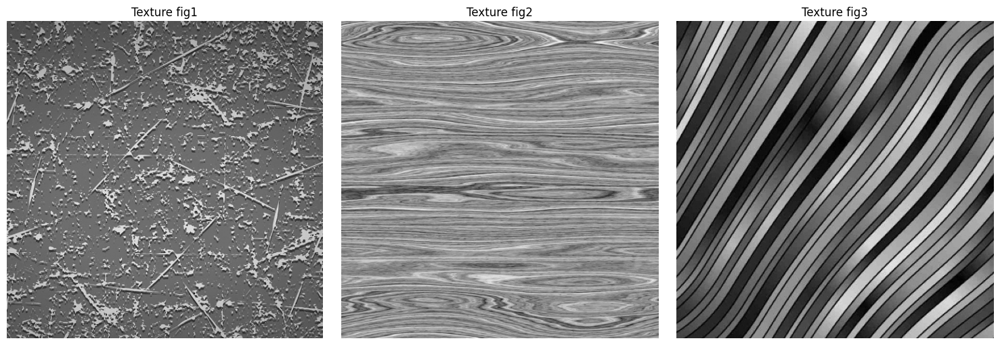

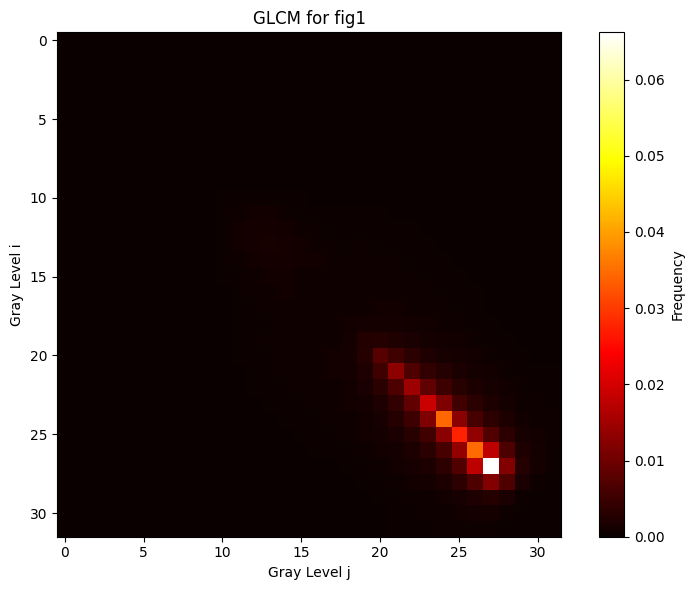


GLCM Properties for fig1:
contrast: 47.017274
dissimilarity: 3.955532
homogeneity: 0.404398
ASM: 0.011424
correlation: 0.736569


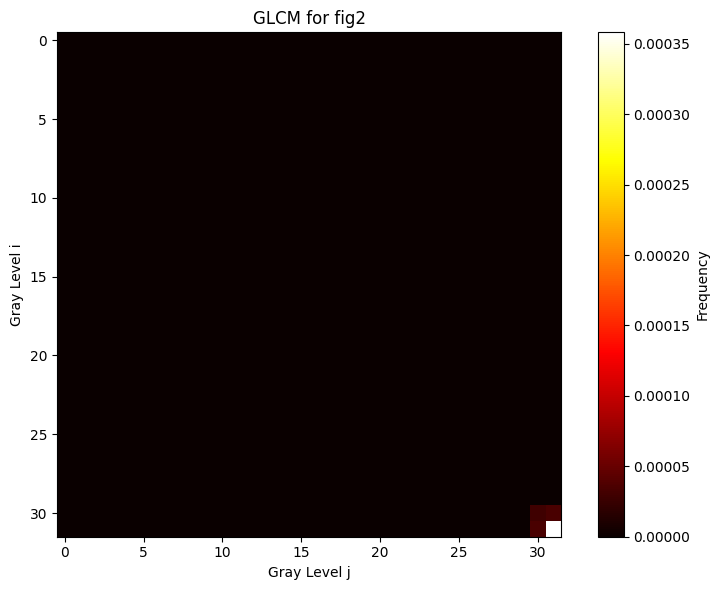


GLCM Properties for fig2:
contrast: 0.462173
dissimilarity: 0.384566
homogeneity: 0.815371
ASM: 0.034027
correlation: 0.986191


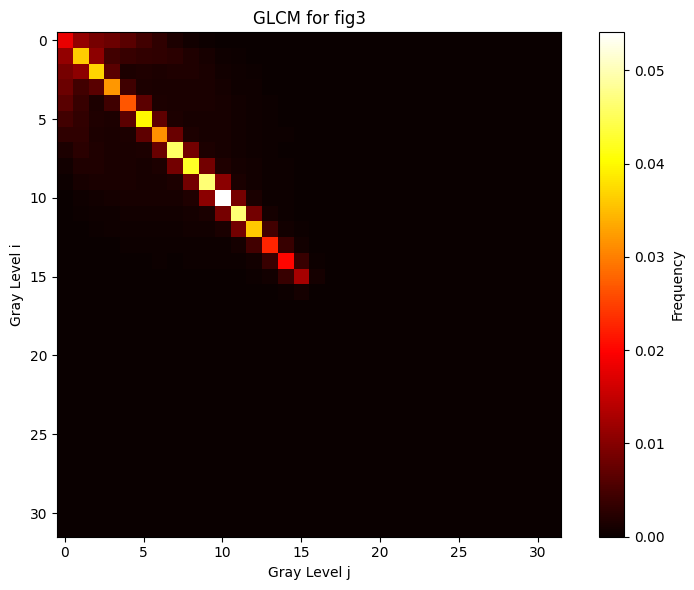


GLCM Properties for fig3:
contrast: 5.057518
dissimilarity: 1.171632
homogeneity: 0.680783
ASM: 0.023357
correlation: 0.854919

GLCM Properties Table:
       contrast  dissimilarity  homogeneity       ASM  correlation
fig1  47.017274       3.955532     0.404398  0.011424     0.736569
fig2   0.462173       0.384566     0.815371  0.034027     0.986191
fig3   5.057518       1.171632     0.680783  0.023357     0.854919


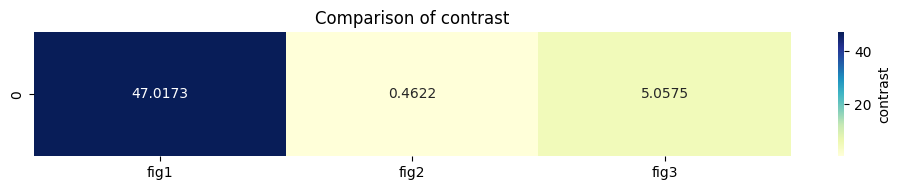

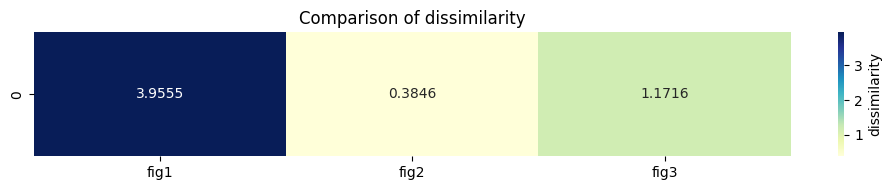

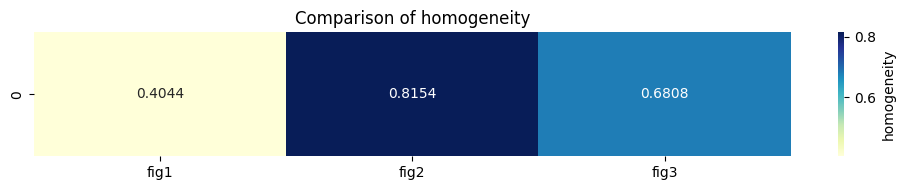

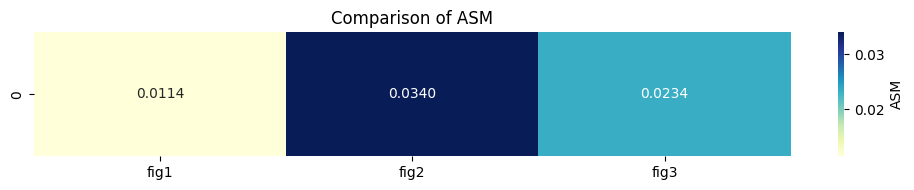

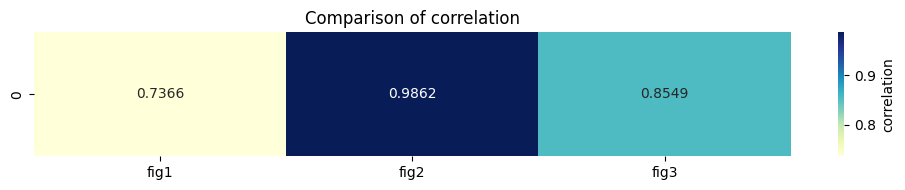


Analyzing GLCM properties at different angles...


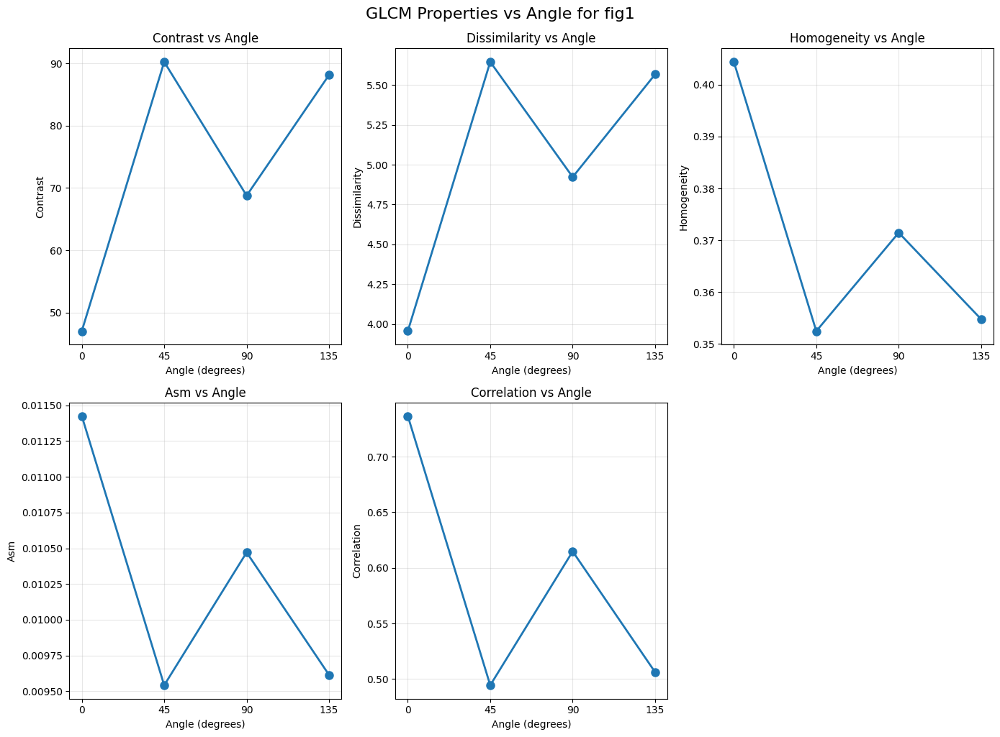

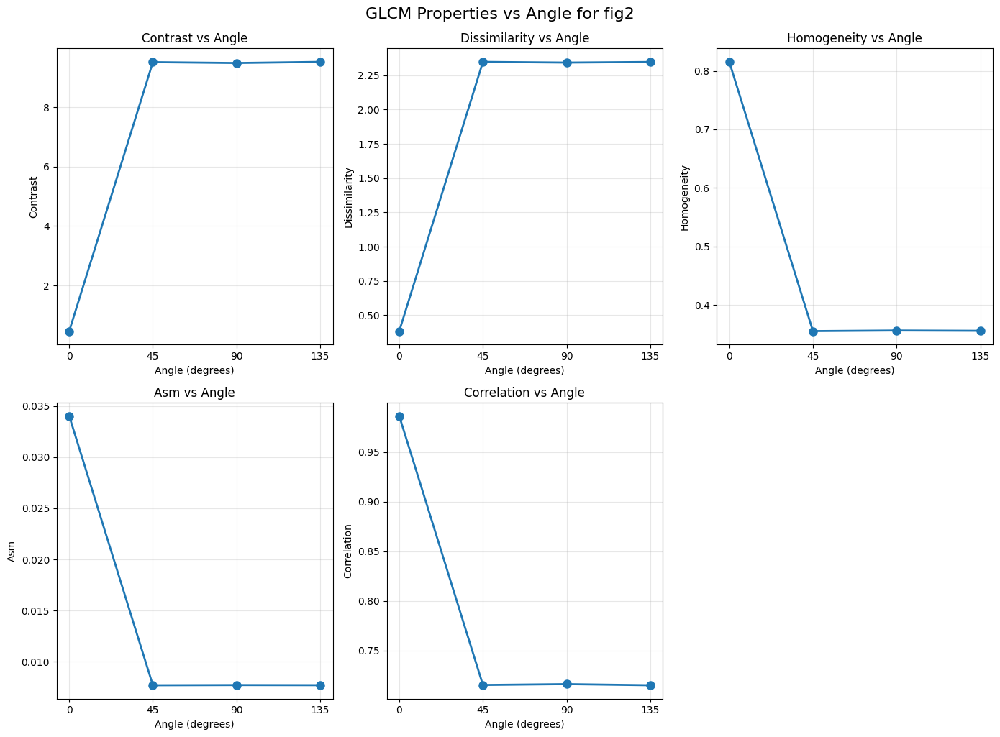

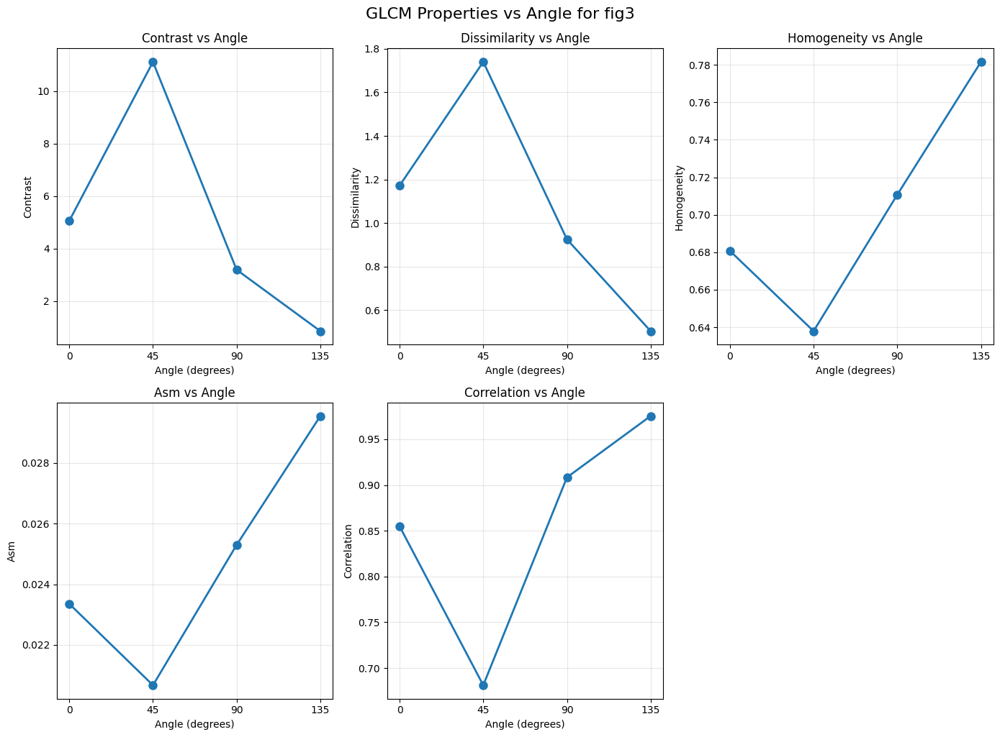


GLCM Properties at 0° angle:
       contrast  dissimilarity  homogeneity       ASM  correlation  angle
fig1  47.017274       3.955532     0.404398  0.011424     0.736569    0.0
fig2   0.462173       0.384566     0.815371  0.034027     0.986191    0.0
fig3   5.057518       1.171632     0.680783  0.023357     0.854919    0.0

GLCM Properties at 45° angle:
       contrast  dissimilarity  homogeneity       ASM  correlation  angle
fig1  90.231875       5.645124     0.352492  0.009543     0.494435   45.0
fig2   9.524751       2.348090     0.355396  0.007694     0.715439   45.0
fig3  11.112909       1.740095     0.637945  0.020672     0.681190   45.0

GLCM Properties at 90° angle:
       contrast  dissimilarity  homogeneity       ASM  correlation  angle
fig1  68.764722       4.922545     0.371469  0.010471     0.614787   90.0
fig2   9.496229       2.342901     0.356385  0.007714     0.716295   90.0
fig3   3.193202       0.924884     0.710700  0.025300     0.908366   90.0

GLCM Properties at 

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops
import pandas as pd
import seaborn as sns

def load_texture_images():
    """加载纹理图像"""
    textures = {}
    for i in range(1, 4):
        img = cv2.imread(f"images/fig{i}.jpg")
        if img is None:
            print(f"Error: Could not load image fig{i}.jpg")
            continue
        # 转换为灰度图
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        textures[f'fig{i}'] = gray
    return textures

def compute_glcm(image, distances=[1], angles=[0], levels=256, symmetric=True, normed=True):
    """计算灰度共生矩阵"""
    # 如果图像灰度级别太多，可以减少灰度级别以提高计算效率
    if levels < 256:
        image = np.floor(image / 256 * levels).astype(np.uint8)
    
    # 计算GLCM
    glcm = graycomatrix(image, distances=distances, angles=angles, 
                        levels=levels, symmetric=symmetric, normed=normed)
    return glcm

def compute_glcm_properties(glcm):
    """计算GLCM的标量属性"""
    # 计算对比度
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    # 计算不相似性
    dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
    # 计算同质性
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    # 计算角二阶矩(ASM)
    asm = graycoprops(glcm, 'ASM')[0, 0]
    # 计算相关性
    correlation = graycoprops(glcm, 'correlation')[0, 0]
    
    return {
        'contrast': contrast,
        'dissimilarity': dissimilarity,
        'homogeneity': homogeneity,
        'ASM': asm,
        'correlation': correlation
    }

def visualize_glcm(glcm, title="Gray-Level Co-occurrence Matrix"):
    """可视化GLCM"""
    plt.figure(figsize=(8, 6))
    # 只显示GLCM的一部分，以便更好地可视化
    max_display = min(32, glcm.shape[0])
    plt.imshow(glcm[:max_display, :max_display, 0, 0], cmap='hot', interpolation='nearest')
    plt.colorbar(label='Frequency')
    plt.title(title)
    plt.xlabel('Gray Level j')
    plt.ylabel('Gray Level i')
    plt.tight_layout()
    return plt.gcf()

def analyze_angles(image, distances=[1], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4], levels=64):
    """分析不同角度下的GLCM属性"""
    angle_results = []
    angle_degrees = [a * 180 / np.pi for a in angles]
    
    for i, angle in enumerate(angles):
        glcm = compute_glcm(image, distances=distances, angles=[angle], levels=levels)
        props = compute_glcm_properties(glcm)
        props['angle'] = angle_degrees[i]
        angle_results.append(props)
    
    return angle_results

def plot_angle_properties(angle_results, title="GLCM Properties vs Angle"):
    """绘制不同角度下的GLCM属性"""
    df = pd.DataFrame(angle_results)
    
    plt.figure(figsize=(14, 10))
    
    # 为每个属性创建子图
    properties = ['contrast', 'dissimilarity', 'homogeneity', 'ASM', 'correlation']
    
    for i, prop in enumerate(properties):
        plt.subplot(2, 3, i+1)
        plt.plot(df['angle'], df[prop], 'o-', linewidth=2, markersize=8)
        plt.xlabel('Angle (degrees)')
        plt.ylabel(prop.capitalize())
        plt.title(f'{prop.capitalize()} vs Angle')
        plt.grid(True, alpha=0.3)
        plt.xticks(df['angle'])
    
    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    return plt.gcf()

def create_comparison_heatmap(results_dict, property_name):
    """创建比较热图"""
    # 准备数据
    data = {}
    for img_name, props in results_dict.items():
        data[img_name] = props[property_name]
    
    # 创建DataFrame
    df = pd.DataFrame([data])
    
    # 绘制热图
    plt.figure(figsize=(10, 2))
    sns.heatmap(df, annot=True, fmt=".4f", cmap="YlGnBu", cbar_kws={'label': property_name})
    plt.title(f'Comparison of {property_name}')
    plt.tight_layout()
    return plt.gcf()

# 主程序
def main():
    # 加载纹理图像
    textures = load_texture_images()
    
    if len(textures) == 0:
        print("No texture images loaded. Please check the file paths.")
        return
    
    # 显示原始图像
    plt.figure(figsize=(15, 5))
    for i, (name, img) in enumerate(textures.items()):
        plt.subplot(1, 3, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(f'Texture {name}')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('texture_images.png')
    plt.show()
    
    # 计算并显示GLCM
    glcm_results = {}
    glcm_props = {}
    
    for name, img in textures.items():
        # 使用较少的灰度级别以提高计算效率
        levels = 64
        glcm = compute_glcm(img, levels=levels)
        glcm_results[name] = glcm
        
        # 可视化GLCM
        fig = visualize_glcm(glcm, f'GLCM for {name}')
        plt.savefig(f'glcm_{name}.png')
        plt.show()
        
        # 计算GLCM属性
        props = compute_glcm_properties(glcm)
        glcm_props[name] = props
        
        print(f"\nGLCM Properties for {name}:")
        for prop, value in props.items():
            print(f"{prop}: {value:.6f}")
    
    # 创建属性表格
    prop_df = pd.DataFrame(glcm_props).T
    print("\nGLCM Properties Table:")
    print(prop_df)
    
    # 保存表格为CSV
    prop_df.to_csv('glcm_properties.csv')
    
    # 创建属性比较热图
    for prop in ['contrast', 'dissimilarity', 'homogeneity', 'ASM', 'correlation']:
        fig = create_comparison_heatmap(glcm_props, prop)
        plt.savefig(f'comparison_{prop}.png')
        plt.show()
    
    # 分析不同角度
    print("\nAnalyzing GLCM properties at different angles...")
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # 0°, 45°, 90°, 135°
    
    angle_results = {}
    for name, img in textures.items():
        angle_props = analyze_angles(img, angles=angles)
        angle_results[name] = angle_props
        
        # 绘制不同角度下的属性变化
        fig = plot_angle_properties(angle_props, f'GLCM Properties vs Angle for {name}')
        plt.savefig(f'angle_properties_{name}.png')
        plt.show()
    
    # 创建不同角度的属性表格
    for i, angle in enumerate([0, 45, 90, 135]):
        angle_props = {}
        for name in textures.keys():
            angle_props[name] = angle_results[name][i]
        
        angle_df = pd.DataFrame(angle_props).T
        print(f"\nGLCM Properties at {angle}° angle:")
        print(angle_df)
        
        # 保存表格为CSV
        angle_df.to_csv(f'glcm_properties_{angle}deg.csv')
    
    # 创建完整的属性表格（包含所有角度）
    full_results = {}
    for name in textures.keys():
        for i, angle in enumerate([0, 45, 90, 135]):
            full_results[f'{name}_{angle}deg'] = angle_results[name][i]
    
    full_df = pd.DataFrame(full_results).T
    print("\nComplete GLCM Properties Table (all angles):")
    print(full_df)
    
    # 保存完整表格为CSV
    full_df.to_csv('glcm_properties_all_angles.csv')

if __name__ == "__main__":
    main()


## 2.3

In [14]:
fingerprintImg=cv2.imread("images/fingerprint.jpg")
fingerprintMask=cv2.imread("images/fingerprint_mask.jpg")

(377, 365)
(377, 365)


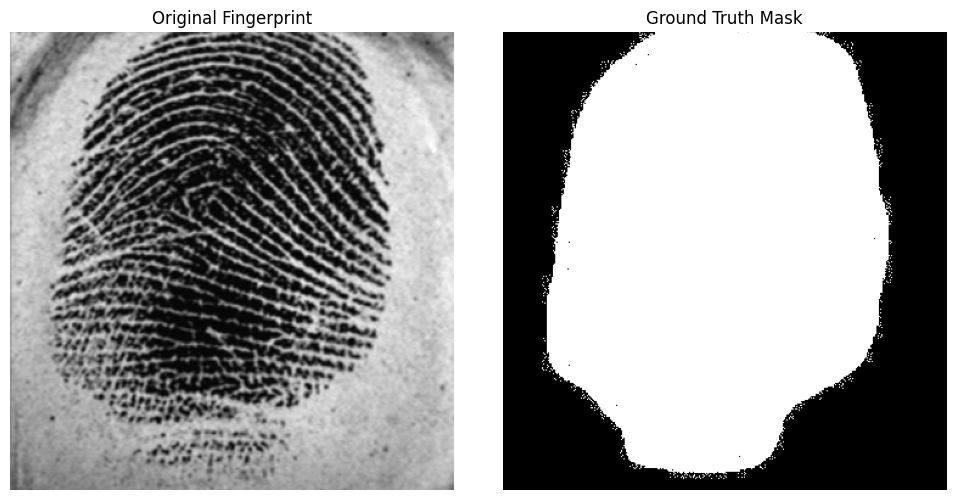

Parameters: window_size=16, step_size=8, levels=8
GLCM distances: [1], angles: [0.0, 45.0, 90.0, 135.0] degrees
GLCM feature computation time: 0.61 seconds

Segmentation Evaluation:
Accuracy: 0.9438
IoU: 0.9074
Dice Coefficient: 0.0037


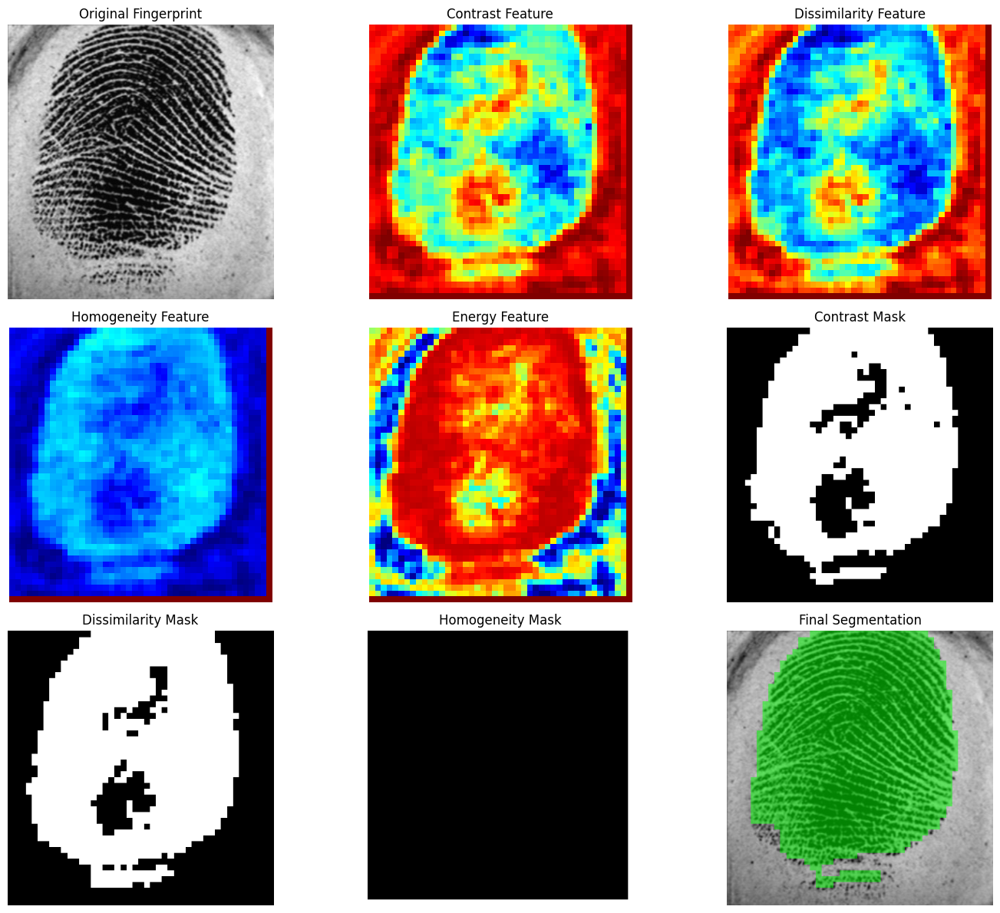

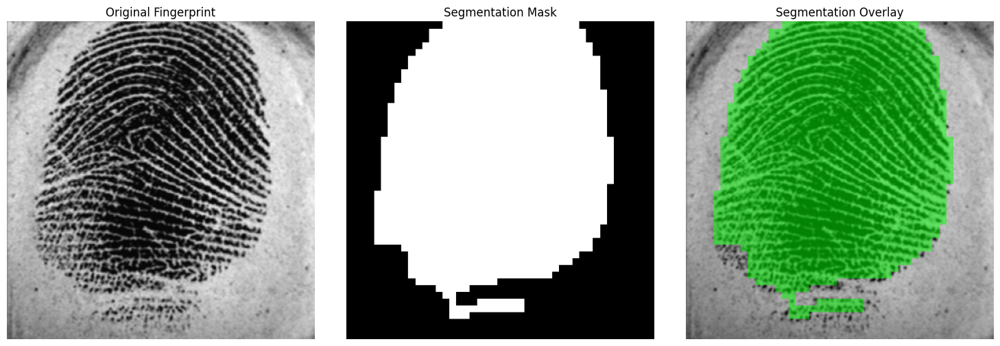

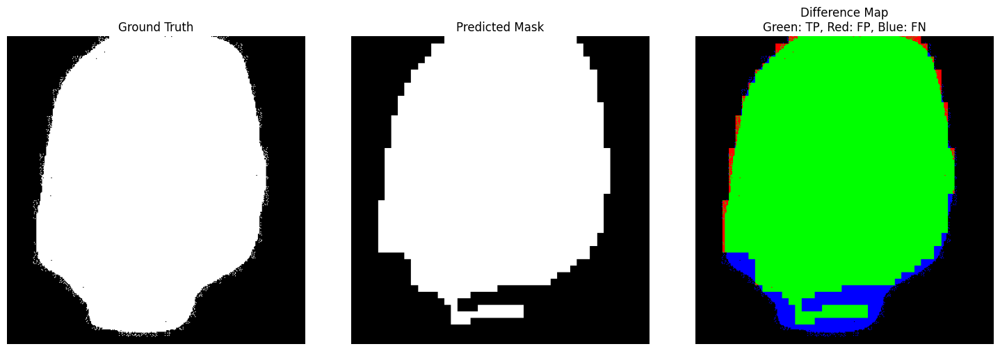

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops
import time

def load_images():
    """加载指纹图像和掩码"""
    fingerprint = cv2.imread("images/fingerprint.jpg", cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread("images/fingerprint_mask.jpg", cv2.IMREAD_GRAYSCALE)
    # 获取 fingerprint 的尺寸
    height, width = fingerprint.shape

    # 将 mask 缩放到与 fingerprint 相同的大小
    mask = cv2.resize(mask, (width, height))
    
    if fingerprint is None:
        print("Error: Could not load fingerprint image.")
        return None, None
    
    if mask is None:
        print("Error: Could not load fingerprint mask.")
        return fingerprint, None
    
    # 确保掩码是二值图像
    if mask is not None:
        _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    
    return fingerprint, mask

def compute_glcm_features(image, window_size=16, step_size=8, distances=[1], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4], levels=8):
    """计算图像的GLCM特征"""
    h, w = image.shape
    
    # 初始化特征图
    contrast_map = np.zeros((h // step_size, w // step_size))
    dissimilarity_map = np.zeros_like(contrast_map)
    homogeneity_map = np.zeros_like(contrast_map)
    energy_map = np.zeros_like(contrast_map)
    correlation_map = np.zeros_like(contrast_map)
    
    # 计时开始
    start_time = time.time()
    
    # 对每个窗口计算GLCM特征
    for i in range(0, h - window_size + 1, step_size):
        for j in range(0, w - window_size + 1, step_size):
            # 提取窗口
            window = image[i:i+window_size, j:j+window_size]
            
            # 重要修复：确保窗口中的灰度值小于levels
            # 通过重新缩放灰度值到[0, levels-1]范围
            if levels < 256:
                window = np.floor(window / 256 * levels).astype(np.uint8)
            
            # 计算GLCM
            glcm = graycomatrix(window, distances=distances, angles=angles, 
                               levels=levels, symmetric=True, normed=True)
            
            # 计算GLCM属性
            contrast = graycoprops(glcm, 'contrast').mean()
            dissimilarity = graycoprops(glcm, 'dissimilarity').mean()
            homogeneity = graycoprops(glcm, 'homogeneity').mean()
            energy = graycoprops(glcm, 'ASM').mean()  # 注意：ASM在skimage中对应energy
            correlation = graycoprops(glcm, 'correlation').mean()
            
            # 存储特征
            map_i, map_j = i // step_size, j // step_size
            contrast_map[map_i, map_j] = contrast
            dissimilarity_map[map_i, map_j] = dissimilarity
            homogeneity_map[map_i, map_j] = homogeneity
            energy_map[map_i, map_j] = energy
            correlation_map[map_i, map_j] = correlation
    
    # 计时结束
    processing_time = time.time() - start_time
    print(f"GLCM feature computation time: {processing_time:.2f} seconds")
    
    # 返回所有特征图
    return {
        'contrast': contrast_map,
        'dissimilarity': dissimilarity_map,
        'homogeneity': homogeneity_map,
        'energy': energy_map,
        'correlation': correlation_map
    }

def normalize_feature_map(feature_map):
    """归一化特征图到0-1范围"""
    min_val = np.min(feature_map)
    max_val = np.max(feature_map)
    
    if max_val > min_val:
        normalized = (feature_map - min_val) / (max_val - min_val)
    else:
        normalized = np.zeros_like(feature_map)
    
    return normalized

def create_binary_mask(feature_map, threshold_method='otsu', manual_threshold=None):
    """根据特征图创建二值掩码"""
    # 将特征图归一化到0-255范围
    feature_map_normalized = normalize_feature_map(feature_map) * 255
    feature_map_normalized = feature_map_normalized.astype(np.uint8)
    
    # 应用阈值方法
    if threshold_method == 'otsu':
        _, binary_mask = cv2.threshold(feature_map_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    elif threshold_method == 'manual':
        _, binary_mask = cv2.threshold(feature_map_normalized, manual_threshold, 255, cv2.THRESH_BINARY)
    else:
        # 默认使用Otsu
        _, binary_mask = cv2.threshold(feature_map_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    return binary_mask

def post_process_mask(binary_mask, original_shape, step_size, morph_kernel_size=5):
    """后处理二值掩码"""
    # 调整掩码大小以匹配原始图像
    mask_resized = cv2.resize(binary_mask, (original_shape[1], original_shape[0]), 
                             interpolation=cv2.INTER_NEAREST)
    
    # 应用形态学操作
    kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)
    mask_opened = cv2.morphologyEx(mask_resized, cv2.MORPH_OPEN, kernel)
    mask_closed = cv2.morphologyEx(mask_opened, cv2.MORPH_CLOSE, kernel)
    
    # 填充孔洞
    contours, _ = cv2.findContours(mask_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask_filled = np.zeros_like(mask_closed)
    cv2.drawContours(mask_filled, contours, -1, 255, -1)
    
    return mask_filled

def evaluate_segmentation(predicted_mask, ground_truth_mask):
    """评估分割结果"""
    if ground_truth_mask is None:
        print("No ground truth mask available for evaluation.")
        return None
    
    # 确保掩码是二值的
    _, predicted_binary = cv2.threshold(predicted_mask, 127, 255, cv2.THRESH_BINARY)
    _, ground_truth_binary = cv2.threshold(ground_truth_mask, 127, 255, cv2.THRESH_BINARY)
    
    # 计算像素级别的准确率
    accuracy = np.sum(predicted_binary == ground_truth_binary) / predicted_binary.size
    
    # 计算IoU (Intersection over Union)
    intersection = np.logical_and(predicted_binary, ground_truth_binary).sum()
    union = np.logical_or(predicted_binary, ground_truth_binary).sum()
    iou = intersection / union if union > 0 else 0
    
    # 计算Dice系数
    dice = (2 * intersection) / (predicted_binary.sum() + ground_truth_binary.sum()) if (predicted_binary.sum() + ground_truth_binary.sum()) > 0 else 0
    
    return {
        'accuracy': accuracy,
        'iou': iou,
        'dice': dice
    }

def visualize_results(original_image, feature_maps, binary_masks, final_mask, ground_truth=None):
    """可视化结果"""
    # 创建彩色热图
    def create_heatmap(feature_map):
        normalized = normalize_feature_map(feature_map)
        heatmap = cv2.applyColorMap((normalized * 255).astype(np.uint8), cv2.COLORMAP_JET)
        return heatmap
    
    # 创建掩码叠加图
    def create_overlay(image, mask):
        # 确保图像是3通道的
        if len(image.shape) == 2:
            image_color = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
        else:
            image_color = image.copy()
        
        # 创建掩码叠加
        mask_binary = mask > 127
        overlay = image_color.copy()
        overlay[mask_binary] = [0, 255, 0]  # 绿色表示掩码区域
        
        # 混合原始图像和掩码
        alpha = 0.5
        result = cv2.addWeighted(image_color, 1-alpha, overlay, alpha, 0)
        
        return result
    
    # 1. 显示原始图像和特征图
    plt.figure(figsize=(15, 12))
    
    # 原始图像
    plt.subplot(3, 3, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Fingerprint')
    plt.axis('off')
    
    # 特征图
    feature_names = list(feature_maps.keys())
    for i, name in enumerate(feature_names[:4]):  # 只显示前4个特征
        plt.subplot(3, 3, i+2)
        plt.imshow(create_heatmap(feature_maps[name]))
        plt.title(f'{name.capitalize()} Feature')
        plt.axis('off')
    
    # 2. 显示二值掩码
    for i, name in enumerate(feature_names[:4]):  # 只显示前4个特征的掩码
        plt.subplot(3, 3, i+6)
        plt.imshow(binary_masks[name], cmap='gray')
        plt.title(f'{name.capitalize()} Mask')
        plt.axis('off')
    
    # 3. 显示最终掩码和地面真值
    plt.subplot(3, 3, 9)
    if ground_truth is not None:
        # 显示最终掩码与地面真值的比较
        final_overlay = create_overlay(original_image, final_mask)
        plt.imshow(final_overlay)
        plt.title('Final Segmentation')
    else:
        # 只显示最终掩码
        plt.imshow(final_mask, cmap='gray')
        plt.title('Final Mask')
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('fingerprint_segmentation_results.png')
    plt.show()
    
    # 4. 显示最终结果与原始图像的对比
    plt.figure(figsize=(15, 5))
    
    # 原始图像
    plt.subplot(1, 3, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Fingerprint')
    plt.axis('off')
    
    # 最终掩码
    plt.subplot(1, 3, 2)
    plt.imshow(final_mask, cmap='gray')
    plt.title('Segmentation Mask')
    plt.axis('off')
    
    # 掩码叠加
    plt.subplot(1, 3, 3)
    overlay = create_overlay(original_image, final_mask)
    plt.imshow(overlay)
    plt.title('Segmentation Overlay')
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('fingerprint_segmentation_final.png')
    plt.show()
    
    # 5. 如果有地面真值，显示与地面真值的比较
    if ground_truth is not None:
        plt.figure(figsize=(15, 5))
        
        # 地面真值
        plt.subplot(1, 3, 1)
        plt.imshow(ground_truth, cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')
        
        # 预测掩码
        plt.subplot(1, 3, 2)
        plt.imshow(final_mask, cmap='gray')
        plt.title('Predicted Mask')
        plt.axis('off')
        
        # 差异图
        plt.subplot(1, 3, 3)
        # 绿色：正确分类为前景
        # 红色：错误分类（假阳性或假阴性）
        # 黑色：正确分类为背景
        diff = np.zeros((original_image.shape[0], original_image.shape[1], 3), dtype=np.uint8)
        gt_binary = ground_truth > 127
        pred_binary = final_mask > 127
        
        # 真阳性 (绿色)
        diff[np.logical_and(gt_binary, pred_binary)] = [0, 255, 0]
        # 假阳性 (红色)
        diff[np.logical_and(np.logical_not(gt_binary), pred_binary)] = [255, 0, 0]
        # 假阴性 (蓝色)
        diff[np.logical_and(gt_binary, np.logical_not(pred_binary))] = [0, 0, 255]
        
        plt.imshow(diff)
        plt.title('Difference Map\nGreen: TP, Red: FP, Blue: FN')
        plt.axis('off')
        
        plt.tight_layout()
        plt.savefig('fingerprint_segmentation_comparison.png')
        plt.show()

def combine_masks(binary_masks, method='voting'):
    """组合多个二值掩码"""
    if method == 'voting':
        # 投票法：多数掩码认为是前景的像素被分类为前景
        combined = np.zeros_like(list(binary_masks.values())[0])
        threshold = len(binary_masks) / 2
        
        for mask in binary_masks.values():
            combined += (mask > 127).astype(np.uint8)
        
        combined = (combined > threshold) * 255
        combined = combined.astype(np.uint8)
        
    elif method == 'intersection':
        # 交集法：所有掩码都认为是前景的像素被分类为前景
        combined = np.ones_like(list(binary_masks.values())[0]) * 255
        
        for mask in binary_masks.values():
            combined = np.minimum(combined, mask)
            
    elif method == 'union':
        # 并集法：任一掩码认为是前景的像素被分类为前景
        combined = np.zeros_like(list(binary_masks.values())[0])
        
        for mask in binary_masks.values():
            combined = np.maximum(combined, mask)
            
    elif method == 'weighted':
        # 加权法：根据每个特征的重要性加权组合
        weights = {
            'contrast': 0.3,
            'dissimilarity': 0.2,
            'homogeneity': 0.3,
            'energy': 0.1,
            'correlation': 0.1
        }
        
        combined = np.zeros_like(list(binary_masks.values())[0], dtype=np.float32)
        total_weight = 0
        
        for name, mask in binary_masks.items():
            if name in weights:
                weight = weights[name]
                combined += (mask > 127).astype(np.float32) * weight
                total_weight += weight
        
        if total_weight > 0:
            combined = (combined / total_weight > 0.5) * 255
        else:
            combined = np.zeros_like(list(binary_masks.values())[0])
        
        combined = combined.astype(np.uint8)
        
    else:
        # 默认使用投票法
        return combine_masks(binary_masks, 'voting')
    
    return combined

def main():
    # 加载图像
    fingerprint, ground_truth = load_images()
    print(fingerprint.shape)
    print(ground_truth.shape)
    
    if fingerprint is None:
        print("Error: Could not proceed without fingerprint image.")
        return
    
    # 显示原始图像
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(fingerprint, cmap='gray')
    plt.title('Original Fingerprint')
    plt.axis('off')
    
    if ground_truth is not None:
        plt.subplot(1, 2, 2)
        plt.imshow(ground_truth, cmap='gray')
        plt.title('Ground Truth Mask')
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('fingerprint_original.png')
    plt.show()
    
    # 参数设置 - 修改灰度级别为更小的值
    window_size = 16  # 窗口大小
    step_size = 8     # 步长
    distances = [1]   # GLCM距离
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # GLCM角度
    levels = 8        # 灰度级别 - 降低为8，避免灰度值超出范围
    
    print(f"Parameters: window_size={window_size}, step_size={step_size}, levels={levels}")
    print(f"GLCM distances: {distances}, angles: {[a*180/np.pi for a in angles]} degrees")
    
    # 计算GLCM特征
    feature_maps = compute_glcm_features(
        fingerprint, window_size, step_size, distances, angles, levels
    )
    
    # 为每个特征创建二值掩码
    binary_masks = {}
    for name, feature_map in feature_maps.items():
        # 根据特征选择合适的阈值方法
        if name in ['contrast', 'dissimilarity']:
            # 对比度和不相似性：值高的是指纹区域
            binary_mask = create_binary_mask(feature_map, 'otsu')
        elif name in ['homogeneity', 'energy']:
            # 同质性和能量：值低的是指纹区域
            binary_mask = create_binary_mask(1 - feature_map, 'otsu')
        else:
            # 相关性：使用Otsu方法
            binary_mask = create_binary_mask(feature_map, 'otsu')
        
        # 调整掩码大小以匹配原始图像
        binary_masks[name] = cv2.resize(binary_mask, (fingerprint.shape[1], fingerprint.shape[0]), 
                                       interpolation=cv2.INTER_NEAREST)
    
    # 组合多个掩码
    combined_mask = combine_masks(binary_masks, 'weighted')
    
    # 后处理
    final_mask = post_process_mask(combined_mask, fingerprint.shape, step_size, morph_kernel_size=15)
    
    # 评估分割结果
    if ground_truth is not None:
        metrics = evaluate_segmentation(final_mask, ground_truth)
        print("\nSegmentation Evaluation:")
        print(f"Accuracy: {metrics['accuracy']:.4f}")
        print(f"IoU: {metrics['iou']:.4f}")
        print(f"Dice Coefficient: {metrics['dice']:.4f}")
    
    # 可视化结果
    visualize_results(fingerprint, feature_maps, binary_masks, final_mask, ground_truth)

if __name__ == "__main__":
    main()


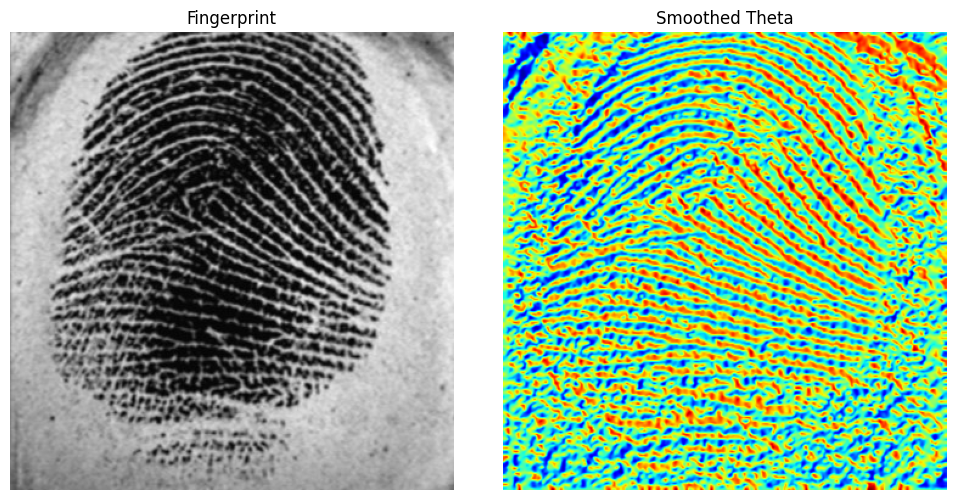

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 读取指纹图像
fingerprint = cv2.imread("images/fingerprint.jpg", cv2.IMREAD_GRAYSCALE)

# 计算 Sobel 梯度
sobel_x = cv2.Sobel(fingerprint, cv2.CV_64F, 1, 0, ksize=5)  # x方向梯度
sobel_y = cv2.Sobel(fingerprint, cv2.CV_64F, 0, 1, ksize=5)  # y方向梯度

# 计算 θ
theta = np.arctan2(sobel_y, sobel_x)

# 可选：将 θ 转换为角度
theta_degrees = np.degrees(theta)

# 平滑 θ 以确保连续性
theta_smoothed = cv2.GaussianBlur(theta_degrees, (5, 5), 0)

# 使用 matplotlib 显示结果
plt.figure(figsize=(10, 5))

# 显示原始指纹图像
plt.subplot(1, 2, 1)
plt.imshow(fingerprint, cmap='gray')
plt.title('Fingerprint')
plt.axis('off')

# 显示平滑后的 θ 图像
plt.subplot(1, 2, 2)
plt.imshow(theta_smoothed, cmap='jet')
plt.title('Smoothed Theta')
plt.axis('off')

plt.tight_layout()
plt.show()
